# PROJET N° 7 - Implémenter un modèle de scoring
## Partie 5 : Modélisation avec les 350 principales features
#### Auteur : Henrique DA COSTA
#### Date : Septembre 2021

# Plan <a class="anchor" id="plan"></a>

### [1. Importation des bibliothèques](#1)<a class="anchor" id="plan"></a>
### [2. Préparation des jeux de données](#2)<a class="anchor" id="plan"></a>
### [3. Initialisation de la modélisation avec la librairie Pycaret avec l'ensmble des features](#3)<a class="anchor" id="plan"></a>
### [4. Sélection des 350 principales features](#4)<a class="anchor" id="plan"></a>
### [5. Réexécuter l'initialidation de la modélisation avec les 350 principales features](#5)<a class="anchor" id="plan"></a>
### [6. Entraînement du modèle Lightgbm sur un jeu normalisé avec les 350 features principales](#6)<a class="anchor" id="plan"></a>
### [7. Entraînement du modèle Linear Discriminant Analysis (LDA) sur un jeu normalisé avec les 350 features principales](#7)<a class="anchor" id="plan"></a>

### -------------------------------------------------------------------------------------------------------------------------------

## [1. Importation des bibliothèques](#plan)<a class="anchor" id="1"></a>

In [1]:
# importation de structures de données 
import pandas as pd
import numpy as np
from scipy.stats import uniform

# importation de bibliothèques de traçage
import matplotlib.pyplot as plt
import seaborn as sns
# from prettytable import PrettyTable

# importation de bibliothèques diverses
import os
import gc
import pickle
import warnings
warnings.filterwarnings('ignore')
from datetime import datetime

# largeur de cellule notebook 100 % 
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.impute import SimpleImputer

# autres bibliothèques de modélisation
from bayes_opt import BayesianOptimization
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import XGBRegressor

import lightgbm as lgb
from lightgbm import LGBMClassifier
from lightgbm import LGBMRegressor

# Librairie Pycaret
import pycaret
from pycaret.classification import *
from pycaret.utils import check_metric
from sklearn.metrics import log_loss

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import phik
    
# for 100% jupyter notebook cell width
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# pandas DataFrame column and row display limits
pd.set_option('max_columns', None)
pd.set_option('max_rows', None)

import warnings
warnings.filterwarnings('ignore')

## [2. Préparation des jeux de données](#plan)<a class="anchor" id="2"></a>

In [2]:
# Chargement des fichiers csv
train_df = pd.read_csv("data_model/train_data.csv").drop("Unnamed: 0",axis=1) # sans TARGET
test_df = pd.read_csv("data_model/test_data.csv").drop("Unnamed: 0",axis=1) # sans TARGET
y = pd.read_csv("data_model/y_train.csv").drop("Unnamed: 0",axis=1) # TARGET

In [3]:
# Chargement des fichiers application_train et application_test
application_train = pd.read_csv('data/application_train.csv')
application_test = pd.read_csv('data/application_test.csv')

In [4]:
# Chargement des fichiers numpy array
x_train_std = np.load('data_model/x_train_std.npy') # sans TARGET
x_test_std = np.load('data_model/x_test_std.npy') # sans TARGET

In [14]:
# Conversion array en dataframe
train_df_std = pd.DataFrame(x_train_std)
test_df_std = pd.DataFrame(x_test_std)

In [15]:
list_columns = train_df.columns.tolist()

In [16]:
train_df_std.columns = list_columns
test_df_std.columns = list_columns

In [17]:
# Jeu d'entraînement normalisé avec TARGET pour entraînement Pycaret
train_df_std['TARGET'] = y['TARGET']

In [26]:
# Ajout Identifiant client
train_df_std['SK_ID_CURR'] = application_train['SK_ID_CURR']
test_df_std['SK_ID_CURR'] = application_test['SK_ID_CURR']

In [31]:
# Déplacement Identifiant client en première colonne
cols_train = train_df_std.columns.tolist()
cols_train = cols_train[-1:] + cols_train[:-1]
train_df_std = train_df_std[cols_train]

cols_test = test_df_std.columns.tolist()
cols_test = cols_test[-1:] + cols_test[:-1]
test_df_std = test_df_std[cols_test]

In [47]:
# Sauvegarde des jeux pour entraînement pycaret
train_df_std.to_csv('data_pycaret/train_df_std.csv')
test_df_std.to_csv('data_pycaret/test_df_std.csv')

In [6]:
# Chargement des fichiers pour entraînement pycaret
train_df_std = pd.read_csv('data_pycaret/train_df_std.csv').drop("Unnamed: 0",axis=1)
test_df_std = pd.read_csv('data_pycaret/test_df_std.csv').drop("Unnamed: 0",axis=1)

In [7]:
display(train_df_std.head(1))
print(train_df_std.shape)

,SK_ID_CURR,AMT_PAYMENT_RATIO_MAX_LAST_1_YEAR,EXP_AMT_PAYMENT_RATIO_LAST_MEAN,AMT_DECLINED_SUM_FIRST_2,CNT_INSTALMENT_MEAN_REST_MAX,HOUSETYPE_MODE_0,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CONTRACT_APPROVED_MEAN,EXP_BALANCE_LIMIT_RATIO_LAST_YEAR_1,APPLICATION_AMT_TO_DECISION_RATIO_MEAN_ALL,SK_DPD_RATIO_MEAN_YEAR_1_MEAN,TOTAL_TERM_MEAN_YEAR_1_SUM,AMT_BALANCE_MEAN,TOTAL_TERM_MEAN_MAX,EXP_ENCODED_STATUS_LAST_YEAR_1_MEAN_OVERALL,CNT_INSTALMENT_MEAN_REST_SUM,EXT_SOURCE_MEAN_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,YEARS_BEGINEXPLUATATION_MEDI,DAYS_FIRST_DUE_MEAN_ALL,CREDIT_ANNUITY_RATIO,AMT_REQ_CREDIT_BUREAU_WEEK,TOTAL_TERM_MEAN_REST_MEAN,DAYS_FIRST_DUE_MAX_LAST_5,AMT_CREDIT_GOODS_DIFF_SUM_LAST_5,DAYS_TERMINATION_MAX_LAST_5,DAYS_DETAILS_CHANGE_MUL,AMT_CREDIT_MAX_OVERDUE_SUM_CREDITACTIVE_CLOSED,AGE_EMPLOYED_DIFF_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,RATE_DOWN_PAYMENT_MEAN_LAST_5,FLAG_DOCUMENT_14,AMT_DRAWINGS_ATM_CURRENT_MAX,APARTMENTS_SUM_MEDI_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,SK_DPD_RATIO_MEAN_YEAR_0_MAX,SELLERPLACE_AREA_MEAN_LAST_5,CREDIT_ACTIVE_Bad debt_MEAN_OVERALL,OCCUPATION_TYPE_0,CNT_INSTALMENT_FUTURE_MEAN_YEAR_0_MEAN,DAYS_FIRST_DUE_MEAN_LAST_5,WEIGHTED_STATUS_FIRST_YEAR_REST_MEAN_OVERALL,CREDIT_DOWNPAYMENT_RATIO_MAX_FIRST_2,BUREAU_DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED_REGISTRATION_DIFF,AMT_ANNUITY_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,EXT_SOURCE_2_MAX_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,SELLERPLACE_AREA_MIN_LAST_5,SK_DPD_RATIO_MEAN,CREDIT_TYPE_Unknown type of loan_MEAN_OVERALL,DAYS_PAYMENT_RATIO_MEAN_MIN,NAME_CLIENT_TYPE_MEAN_LAST_5,CHANNEL_TYPE_MEAN_FIRST_2,MONTHS_BALANCE_MAX,BALANCE_LIMIT_RATIO_MIN,EXT_SOURCE_3_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXP_POS_TOTAL_TERM_MEAN_MAX,NUM_INSTALMENT_NUMBER_MAX_MAX,ANNUITY_SUM_ALL,FLAG_PHONE,DAYS_DECISION_MAX_LAST_5,WEIGHTED_STATUS_MEAN_YEAR_REST_MEAN_OVERALL,EXT_SOURCE_1_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,ANNUITY_INCOME_RATIO_MIN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,STATUS_MAX_YEAR_1_MEAN_OVERALL,PRODUCT_COMBINATION_LAST_LAST_5,NAME_GOODS_CATEGORY_LAST_FIRST_2,EXT_SOURCE_3_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,GOOD_DOWNPAYMET_RATIO_MEAN_LAST_5,AMT_ENQ_SUM,DAYS_PAYMENT_DIFF_MEAN_LAST_1_YEAR,CREDIT_DAY_OVERDUE_MAX_CREDITACTIVE_ACTIVE,YEARS_BEGINEXPLUATATION_MODE,AMT_CREDIT_GOODS_RATIO_MEAN_ALL,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,DAYS_FIRST_DUE_MAX_ALL,AMT_INSTALMENT_SUM_FIRST_5_INSTALLMENTS,INTEREST_SHARE_MAX_FIRST_2,CNT_PAYMENT_MEAN_FIRST_2,AMT_INTEREST_SUM_FIRST_2,INTEREST_SHARE_MEAN_ALL,DAYS_PAYMENT_RATIO_MAX_MEAN,ANNUITY_MEAN_FIRST_2,EXP_BALANCE_LIMIT_RATIO_LAST_ACTIVE,NAME_TYPE_SUITE_MEAN_LAST_5,EXT_SOURCE_1_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,AMT_ANNUITY_CREDIT_RATIO_MIN_CREDITACTIVE_CLOSED,NAME_GOODS_CATEGORY_LAST_LAST_5,DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED,APARTMENTS_MODE,AMT_ANNUITY,EXP_MIN_PAYMENT_RATIO_LAST_YEAR_REST,EXP_AMT_PAYMENT_DIFF_LAST_FIRST_5_INSTALLMENTS,STATUS_MEAN_MAX_CREDITACTIVE_ACTIVE,AMT_INTEREST_RECEIVABLE_MEAN_YEAR_REST,APARTMENTS_MEDI,WEIGHTED_STATUS_LAST_YEAR_1_MEAN_OVERALL,PAYMENT_MIN_DIFF_MEAN,AMT_PAYMENT_MEAN_SUM,EXP_POS_TOTAL_TERM_LAST_YEAR_1_MEAN,EXT_SOURCE_1_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXP_BALANCE_LIMIT_RATIO_LAST_YEAR_REST,AMT_CREDIT_MAX_ALL,APARTMENTS_SUM_AVG_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,APARTMENTS_SUM_AVG_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_FIRST_2,BUREAU_DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED_EMPLOYED_DIFF,HOUSETYPE_MODE_1,AMT_INTEREST_MEAN_ALL,AMT_INSTALMENT_MEAN_FIRST_5_INSTALLMENTS,ELEVATORS_MODE,CNT_CREDIT_PROLONG_MEAN_OVERALL,EXT_SOURCE_MEAN_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,CONTRACT_Completed,EXT_SOURCE_2_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,WEIGHTED_STATUS_MEAN_MEAN_CREDITACTIVE_ACTIVE,EXP_AMT_BALANCE_LAST,COMMONAREA_AVG,FLAG_LAST_APPL_PER_CO

(307507, 1243)


In [9]:
display(test_df_std.head(1))
print(test_df_std.shape)

,SK_ID_CURR,AMT_PAYMENT_RATIO_MAX_LAST_1_YEAR,EXP_AMT_PAYMENT_RATIO_LAST_MEAN,AMT_DECLINED_SUM_FIRST_2,CNT_INSTALMENT_MEAN_REST_MAX,HOUSETYPE_MODE_0,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CONTRACT_APPROVED_MEAN,EXP_BALANCE_LIMIT_RATIO_LAST_YEAR_1,APPLICATION_AMT_TO_DECISION_RATIO_MEAN_ALL,SK_DPD_RATIO_MEAN_YEAR_1_MEAN,TOTAL_TERM_MEAN_YEAR_1_SUM,AMT_BALANCE_MEAN,TOTAL_TERM_MEAN_MAX,EXP_ENCODED_STATUS_LAST_YEAR_1_MEAN_OVERALL,CNT_INSTALMENT_MEAN_REST_SUM,EXT_SOURCE_MEAN_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,YEARS_BEGINEXPLUATATION_MEDI,DAYS_FIRST_DUE_MEAN_ALL,CREDIT_ANNUITY_RATIO,AMT_REQ_CREDIT_BUREAU_WEEK,TOTAL_TERM_MEAN_REST_MEAN,DAYS_FIRST_DUE_MAX_LAST_5,AMT_CREDIT_GOODS_DIFF_SUM_LAST_5,DAYS_TERMINATION_MAX_LAST_5,DAYS_DETAILS_CHANGE_MUL,AMT_CREDIT_MAX_OVERDUE_SUM_CREDITACTIVE_CLOSED,AGE_EMPLOYED_DIFF_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,RATE_DOWN_PAYMENT_MEAN_LAST_5,FLAG_DOCUMENT_14,AMT_DRAWINGS_ATM_CURRENT_MAX,APARTMENTS_SUM_MEDI_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,SK_DPD_RATIO_MEAN_YEAR_0_MAX,SELLERPLACE_AREA_MEAN_LAST_5,CREDIT_ACTIVE_Bad debt_MEAN_OVERALL,OCCUPATION_TYPE_0,CNT_INSTALMENT_FUTURE_MEAN_YEAR_0_MEAN,DAYS_FIRST_DUE_MEAN_LAST_5,WEIGHTED_STATUS_FIRST_YEAR_REST_MEAN_OVERALL,CREDIT_DOWNPAYMENT_RATIO_MAX_FIRST_2,BUREAU_DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED_REGISTRATION_DIFF,AMT_ANNUITY_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,EXT_SOURCE_2_MAX_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,SELLERPLACE_AREA_MIN_LAST_5,SK_DPD_RATIO_MEAN,CREDIT_TYPE_Unknown type of loan_MEAN_OVERALL,DAYS_PAYMENT_RATIO_MEAN_MIN,NAME_CLIENT_TYPE_MEAN_LAST_5,CHANNEL_TYPE_MEAN_FIRST_2,MONTHS_BALANCE_MAX,BALANCE_LIMIT_RATIO_MIN,EXT_SOURCE_3_MIN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXP_POS_TOTAL_TERM_MEAN_MAX,NUM_INSTALMENT_NUMBER_MAX_MAX,ANNUITY_SUM_ALL,FLAG_PHONE,DAYS_DECISION_MAX_LAST_5,WEIGHTED_STATUS_MEAN_YEAR_REST_MEAN_OVERALL,EXT_SOURCE_1_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,ANNUITY_INCOME_RATIO_MIN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,STATUS_MAX_YEAR_1_MEAN_OVERALL,PRODUCT_COMBINATION_LAST_LAST_5,NAME_GOODS_CATEGORY_LAST_FIRST_2,EXT_SOURCE_3_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,GOOD_DOWNPAYMET_RATIO_MEAN_LAST_5,AMT_ENQ_SUM,DAYS_PAYMENT_DIFF_MEAN_LAST_1_YEAR,CREDIT_DAY_OVERDUE_MAX_CREDITACTIVE_ACTIVE,YEARS_BEGINEXPLUATATION_MODE,AMT_CREDIT_GOODS_RATIO_MEAN_ALL,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,DAYS_FIRST_DUE_MAX_ALL,AMT_INSTALMENT_SUM_FIRST_5_INSTALLMENTS,INTEREST_SHARE_MAX_FIRST_2,CNT_PAYMENT_MEAN_FIRST_2,AMT_INTEREST_SUM_FIRST_2,INTEREST_SHARE_MEAN_ALL,DAYS_PAYMENT_RATIO_MAX_MEAN,ANNUITY_MEAN_FIRST_2,EXP_BALANCE_LIMIT_RATIO_LAST_ACTIVE,NAME_TYPE_SUITE_MEAN_LAST_5,EXT_SOURCE_1_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,AMT_ANNUITY_CREDIT_RATIO_MIN_CREDITACTIVE_CLOSED,NAME_GOODS_CATEGORY_LAST_LAST_5,DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED,APARTMENTS_MODE,AMT_ANNUITY,EXP_MIN_PAYMENT_RATIO_LAST_YEAR_REST,EXP_AMT_PAYMENT_DIFF_LAST_FIRST_5_INSTALLMENTS,STATUS_MEAN_MAX_CREDITACTIVE_ACTIVE,AMT_INTEREST_RECEIVABLE_MEAN_YEAR_REST,APARTMENTS_MEDI,WEIGHTED_STATUS_LAST_YEAR_1_MEAN_OVERALL,PAYMENT_MIN_DIFF_MEAN,AMT_PAYMENT_MEAN_SUM,EXP_POS_TOTAL_TERM_LAST_YEAR_1_MEAN,EXT_SOURCE_1_MEAN_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,EXP_BALANCE_LIMIT_RATIO_LAST_YEAR_REST,AMT_CREDIT_MAX_ALL,APARTMENTS_SUM_AVG_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,APARTMENTS_SUM_AVG_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN_FIRST_2,BUREAU_DAYS_CREDIT_MEAN_CREDITACTIVE_CLOSED_EMPLOYED_DIFF,HOUSETYPE_MODE_1,AMT_INTEREST_MEAN_ALL,AMT_INSTALMENT_MEAN_FIRST_5_INSTALLMENTS,ELEVATORS_MODE,CNT_CREDIT_PROLONG_MEAN_OVERALL,EXT_SOURCE_MEAN_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,CONTRACT_Completed,EXT_SOURCE_2_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,WEIGHTED_STATUS_MEAN_MEAN_CREDITACTIVE_ACTIVE,EXP_AMT_BALANCE_LAST,COMMONAREA_AVG,FLAG_LAST_APPL_PER_CO

(48744, 1242)


**Echantillons pour entraînement Pycaret**

In [10]:
%time train_sample_std = train_df_std.sample(n=30000, random_state=0)

Wall time: 719 ms


In [ ]:
# test_sample_std = test_df_std.sample(n=30000, random_state=1)

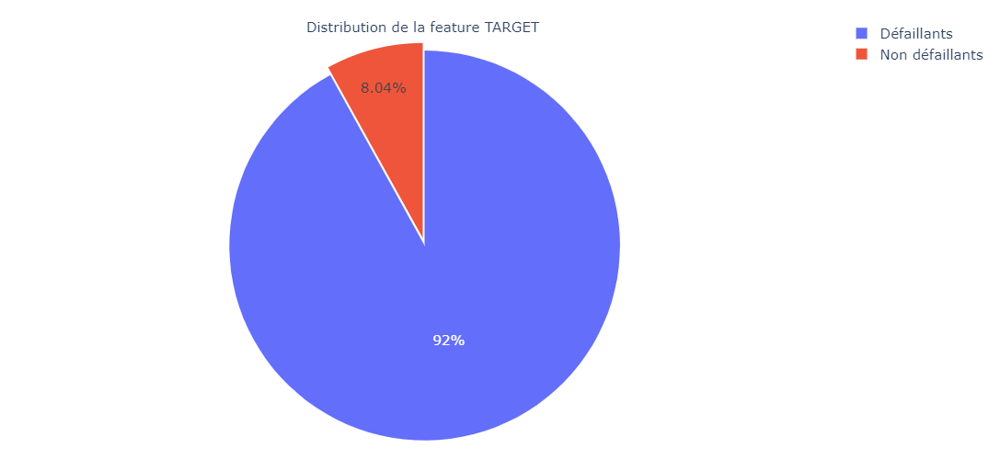

In [11]:
# Distribution Target => Vérifier que la proportion entre Défaillants et Non Défaillants est respectée
target_distribution = train_sample_std.TARGET.value_counts()

import plotly.graph_objects as go

labels = ['Non défaillants','Défaillants']
values = [target_distribution[1], target_distribution[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = 'Distribution de la feature TARGET', pull = [0,0.04])])
fig.update_layout(width=500,height=500, font_size = 15, margin = dict ( l = 20 ,  r = 20 ,  t = 20 ,  b = 20 ))
fig.show()

## [3. Initialisation de la modélisation avec la librairie Pycaret avec l'ensemble des features](#plan)<a class="anchor" id="3"></a>

In [12]:
%time model_setup  =  setup ( data = train_sample_std ,  target = 'TARGET', fix_imbalance = True,  ignore_features = ['SK_ID_CURR'], train_size=0.80, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(30000, 1243)"
5,Missing Values,False
6,Numeric Features,1208
7,Categorical Features,33
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 2min 31s


In [8]:
metriques = get_metrics()
metriques

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x00000261D6A9B160>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<function roc_auc_score at 0x00000261D6A88DC0>,"make_scorer(roc_auc_score, needs_proba=True, e...",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(recall_score, average=macro)",pred,{'average': 'macro'},True,True,False
precision,Precision,Prec.,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(precision_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
f1,F1,F1,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(f1_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
kappa,Kappa,Kappa,<function cohen_kappa_score at 0x00000261D6A9B...,make_scorer(cohen_kappa_score),pred,{},True,True,False
mcc,MCC,MCC,<function matthews_corrcoef at 0x00000261D6A9B...,make_scorer(matthews_corrcoef),pred,{},True,True,False


In [13]:
add_metric('logloss', 'Log Loss', log_loss, greater_is_better = False)

Name                                                       Log Loss
Display Name                                               Log Loss
Score Function            <function log_loss at 0x000002185339D5E0>
Scorer               make_scorer(log_loss, greater_is_better=False)
Target                                                         pred
Args                                                             {}
Greater is Better                                             False
Multiclass                                                     True
Custom                                                         True
Name: logloss, dtype: object

In [14]:
metriques = get_metrics()
metriques

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x0000021853397310>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<function roc_auc_score at 0x0000021852384F70>,"make_scorer(roc_auc_score, needs_proba=True, e...",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(recall_score, average=macro)",pred,{'average': 'macro'},True,True,False
precision,Precision,Prec.,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(precision_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
f1,F1,F1,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(f1_score, average=weighted)",pred,{'average': 'weighted'},True,True,False
kappa,Kappa,Kappa,<function cohen_kappa_score at 0x0000021853397...,make_scorer(cohen_kappa_score),pred,{},True,True,False
mcc,MCC,MCC,<function matthews_corrcoef at 0x0000021853397...,make_scorer(matthews_corrcoef),pred,{},True,True,False
logloss,Log Loss,Log Loss,<function log_loss at 0x000002185339D5E0>,"make_scorer(log_loss, greater_is_better=False)",pred,{},False,True,True


In [11]:
%time best_model  =  compare_models (sort = 'AUC', exclude = ['catboost', 'xgboost'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9176,0.7686,0.0514,0.4234,0.0910,0.0753,0.1242,2.8466,15.7570
gbc,Gradient Boosting Classifier,0.9170,0.7501,0.0416,0.3843,0.0747,0.0602,0.1041,2.8667,169.0260
rf,Random Forest Classifier,0.9185,0.7382,0.0118,0.4052,0.0229,0.0187,0.0579,2.8135,15.8650
et,Extra Trees Classifier,0.9183,0.7374,0.0129,0.3851,0.0248,0.0198,0.0568,2.8207,12.1650
lda,Linear Discriminant Analysis,0.7437,0.7286,0.5757,0.1739,0.2671,0.1628,0.2059,8.8536,19.7380
lr,Logistic Regression,0.7484,0.7261,0.5629,0.1744,0.2662,0.1625,0.2035,8.6910,32.9120
ada,Ada Boost Classifier,0.8967,0.7219,0.1310,0.2444,0.1697,0.1202,0.1272,3.5690,37.1870
knn,K Neighbors Classifier,0.3910,0.6088,0.7904,0.0977,0.1739,0.0345,0.0841,21.0360,86.4060
dt,Decision Tree Classifier,0.8353,0.5501,0.2096,0.1445,0.1709,0.0829,0.0848,5.6875,12.6000
nb,Naive Bayes,0.3037,0.5281,0.7873,0.0860,0.1550,0.0103,0.0302,24.0496,2.1200


Wall time: 1h 11min 37s


In [16]:
%time best_model  =  compare_models (sort = 'AUC', include = ['lightgbm'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9176,0.7686,0.0514,0.4234,0.0910,0.0753,0.1242,2.8466,19.0970


Wall time: 3min 45s


In [17]:
%time best_model_1  =  compare_models (sort = 'AUC', include = ['lda'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lda,Linear Discriminant Analysis,0.7437,0.7286,0.5757,0.1739,0.2671,0.1628,0.2059,8.8536,31.9640


Wall time: 7min 2s


## [4. Sélection des 350 principales features](#plan)<a class="anchor" id="4"></a>

In [35]:
n=350 
X_train=get_config('X_train') 
feature_names = pd.DataFrame(X_train.columns) 
feature_names['var'] = feature_names 
feature_imp = pd.DataFrame(best_model.feature_importances_) 
feature_imp['imp'] = feature_imp 
var_imp = pd .concat([feature_names,feature_imp],axis=1) 
var_imp = var_imp[['var', 'imp']] 
var_imp = var_imp.sort_values(['imp'],ascending=False) 
var_imp_fin=var_imp['var' ].head(n).values.tolist() 
print(var_imp_fin)

['TARGET_NEIGHBORS_500_MEAN', 'WEEKDAY_APPR_PROCESS_START_1', 'REGIONS_RATING_INCOME_MUL_1', 'EMERGENCYSTATE_MODE_0', 'CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE', 'REGION_RATING_CLIENT_0', 'FLAG_WORK_PHONE_-0.498996764421463', 'CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED', 'FLAG_REGIONS', 'FLAG_DOCUMENT_3_0.6390508413314819', 'CREDIT_EXT_RATIO', 'OBS_60_CREDIT_RATIO', 'FLAG_CONTACTS_SUM', 'WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2', 'SK_DPD_DEF_MAX_YEAR_REST_MEAN', 'AMT_INCOME_TOTAL_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY', 'WEEKDAY_APPR_PROCESS_START_MAX_ALL', 'AMT_CREDIT_SUM_LIMIT_MAX_CREDITACTIVE_ACTIVE', 'DAYS_ID_PUBLISH', 'FLAG_PHONE_-0.625244677066803', 'DAYS_BIRTH', 'EXT_SOURCE_MIN', 'AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR', 'WEIGHTED_EXT_SOURCE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL', 'INSTALLMENTS_ANNUITY_AMT_INSTALMENT_MEAN_MAX_RATIO', 'NAME_EDUCATION_TYPE_1', 'CREDIT_GOODS_DIFF', 'AMT_ANNUITY_CREDIT_RATIO_MEAN_OVERALL'

In [36]:
features_350_lgb =  pd.DataFrame(var_imp_fin)
features_350_lgb.to_csv('data_pycaret/features_350_lgb.csv')

In [37]:
pd.set_option('max_columns', None)
pd.set_option('max_rows', None)
features_350_lgb

,0
0,TARGET_NEIGHBORS_500_MEAN
1,WEEKDAY_APPR_PROCESS_START_1
2,REGIONS_RATING_INCOME_MUL_1
3,EMERGENCYSTATE_MODE_0
4,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE...
5,REGION_RATING_CLIENT_0
6,FLAG_WORK_PHONE_-0.498996764421463
7,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE...
8,FLAG_REGIONS
9,FLAG_DOCUMENT_3_0.6390508413314819


In [38]:
for index, elem in enumerate(var_imp_fin):
    if elem == 'FLAG_WORK_PHONE_-0.498996764421463':
        var_imp_fin[index] = 'FLAG_WORK_PHONE'
    if elem == 'FLAG_DOCUMENT_3_0.6390508413314819':
        var_imp_fin[index] = 'FLAG_DOCUMENT_3'
    if elem == 'FLAG_PHONE_-0.625244677066803':
        var_imp_fin[index] = 'FLAG_PHONE'  
    if elem == 'LIVE_CITY_NOT_WORK_CITY_2.1375839710235596':
        var_imp_fin[index] = 'LIVE_CITY_NOT_WORK_CITY'   
    if elem == 'REG_REGION_NOT_WORK_REGION_4.323983669281006':
        var_imp_fin[index] = 'REG_REGION_NOT_WORK_REGION'    
    if elem == 'CNT_NON_CHILDREN_-1.668009638786316':
        var_imp_fin[index] = 'CNT_NON_CHILDREN' 
    if elem == 'REG_CITY_NOT_LIVE_CITY_3.4339487552642822':
        var_imp_fin[index] = 'REG_CITY_NOT_LIVE_CITY' 
        
features_350_lgb =  pd.DataFrame(var_imp_fin)         

In [54]:
features_350_lgb.columns = ['Features importance']
features_350_lgb

,Features importance
0,TARGET_NEIGHBORS_500_MEAN
1,WEEKDAY_APPR_PROCESS_START_1
2,REGIONS_RATING_INCOME_MUL_1
3,EMERGENCYSTATE_MODE_0
4,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE...
...,...
345,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR
346,INTEREST_SHARE_MIN_ALL
347,NAME_PAYMENT_TYPE_MEAN_LAST_5
348,MISSING_VALS_TOTAL_INSTAL_SUM_SUM


In [56]:
features_350_lgb =  pd.DataFrame(var_imp_fin)
features_350_lgb.columns = ['Features importance']
features_350_lgb.to_csv('data_pycaret/features_350_lgb.csv')

In [43]:
train_df_std_350 = train_df_std[['SK_ID_CURR'] + var_imp_fin + ['TARGET']]
display(train_df_std_350.head(2))
print(train_df_std_350.shape)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,FLAG_DOCUMENT_3,CREDIT_EXT_RATIO,OBS_60_CREDIT_RATIO,FLAG_CONTACTS_SUM,WEEKDAY_APPR_PROCESS_START_MIN_FIRST_2,SK_DPD_DEF_MAX_YEAR_REST_MEAN,AMT_INCOME_TOTAL_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,WEEKDAY_APPR_PROCESS_START_MAX_ALL,AMT_CREDIT_SUM_LIMIT_MAX_CREDITACTIVE_ACTIVE,DAYS_ID_PUBLISH,FLAG_PHONE,DAYS_BIRTH,EXT_SOURCE_MIN,AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR,WEIGHTED_EXT_SOURCE,OBS_30_CNT_SOCIAL_CIRCLE,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_OVERALL,INSTALLMENTS_ANNUITY_AMT_INSTALMENT_MEAN_MAX_RATIO,NAME_EDUCATION_TYPE_1,CREDIT_GOODS_DIFF,AMT_ANNUITY_CREDIT_RATIO_MEAN_OVERALL,AMT_CREDIT_MAX_OVERDUE_MAX_CREDITACTIVE_ACTIVE,AMT_PAYMENT_DIFF_MAX_LAST_1_YEAR,CREDIT_DAY_OVERDUE_MAX_CREDITACTIVE_CLOSED,OCCUPATION_TYPE_0,CAR_EMPLOYED_RATIO,ORGANIZATION_TYPE_1,AMT_PAYMENT_DIFF_MAX_FIRST_5_INSTALLMENTS,NAME_CONTRACT_STATUS_MEAN_ALL,NAME_TYPE_SUITE_LAST_FIRST_2,AMT_CREDIT_SUM_SUM_CREDITACTIVE_ACTIVE,AMT_ANNUITY_SUM_CREDITACTIVE_CLOSED,EXT_SOURCE_2,CREDIT_TYPE_Car loan_MEAN_OVERALL,AMT_ANNUITY,CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_ACTIVE,EXT_SOURCE_VAR,AMT_CREDIT_SUM_DEBT_MEAN_OVERALL,NAME_YIELD_GROUP_LAST_LAST_5,LIVE_CITY_NOT_WORK_CITY,ANNUITY_INCOME_RATIO_MEAN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,CURRENT_CREDIT_DEBT_DIFF_MIN_CREDITACTIVE_ACTIVE,DAYS_CREDIT_MAX_CREDITACTIVE_CLOSED,AMT_CREDIT_MAX_OVERDUE_SUM_CREDITACTIVE_ACTIVE,SK_DPD_DEF_MAX_YEAR_1_MEAN,EXT_SOURCE_3,INTEREST_SHARE_MAX_ALL,DEF_30_60_SUM,DAYS_CREDIT_MEAN_CREDITACTIVE_ACTIVE,EXT_SOURCE_MEAN,DAYS_TERMINATION_MAX_ALL,EMPLOYED_TO_AGE_RATIO,AMT_CREDIT_SUM_LIMIT_MEAN_OVERALL,CURRENT_CREDIT_DEBT_DIFF_MIN_CREDITACTIVE_CLOSED,DEF_30_CREDIT_RATIO,CREDIT_GOODS_RATIO,DAYS_PAYMENT_DIFF_MAX_MEAN,WEEKDAY_APPR_PROCESS_START_MIN_ALL,CREDIT_TYPE_Microloan_MEAN_OVERALL,NAME_CLIENT_TYPE_LAST_FIRST_2,DAYS_PAYMENT_RATIO_MEAN_MAX,CREDIT_ANNUITY_RATIO,AGE_EMPLOYED_DIFF_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,DAYS_CREDIT_MIN_CREDITACTIVE_CLOSED,NAME_SELLER_INDUSTRY_MEAN_FIRST_2,REG_REGION_NOT_WORK_REGION,SK_DPD_DEF_MAX_ACTIVE_MEAN,CNT_INSTALMENT_MEAN_COMPLETED_SUM,EXT_SOURCE_3_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,SK_DPD_MAX_YEAR_1_MEAN,EXP_DAYS_PAYMENT_RATIO_LAST_MEAN,BUREAU_DAYS_CREDIT_MAX_CREDITACTIVE_CLOSED_EMPLOYED_DIFF,BUREAU_AMT_CREDIT_MAX_OVERDUE_MEAN_OVERALL_INCOME_RATIO,EXP_AMT_PAYMENT_RATIO_LAST_LAST_1_YEAR,EXP_CNT_INSTALMENT_FUTURE_LAST_MEAN,EXT_SOURCE_1_MIN_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,DAYS_PAYMENT_DIFF_MIN_FIRST_5_INSTALLMENTS,DAYS_CREDIT_LAST_CREDITACTIVE_ACTIVE,MISSING_VALS_TOTAL_APP,EXP_CNT_INSTALMENT_FUTURE_LAST_ACTIVE_MEAN,CREDIT_TYPE_Credit card_MEAN_OVERALL,INTEREST_RATE_MAX_LAST_5,NAME_CLIENT_TYPE_MEAN_LAST_5,SELLERPLACE_AREA_MIN_FIRST_2,DAYS_PAYMENT_DIFF_MIN_MEAN,EXPECTED_CNT_PAYMENT,INSTALLMENTS_AMT_PAYMENT_MEAN_MEAN_INCOME_RATIO,AMT_PAYMENT_DIFF_MEAN_MEAN,AMT_CREDIT_APPLICATION_RATIO_MEAN_ALL,AMT_CREDIT_SUM_MAX_CREDITACTIVE_ACTIVE,NAME_CASH_LOAN_PURPOSE_MEAN_ALL,EXP_AMT_PAYMENT_DIFF_LAST_MEAN,EXT_SOURCE_MUL,ENQ_CREDIT_RATIO,AMT_GOODS_PRICE,AMT_APPLICATION_TO_SELLERPLACE_AREA_MAX_LAST_5,DAYS_EMPLOYED,EXT_SOURCE_MAX,WEEKDAY_APPR_PROCESS_START_MEAN_FIRST_2,CURRENT_CREDIT_DEBT_DIFF_MEAN_CREDITACTIVE_CLOSED,WEEKDAY_APPR_PROCESS_START_MAX_FIRST_2,SELLERPLACE_AREA_MEAN_FIRST_2,ANNUITY_INCOME_RATIO_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_CREDIT_YIELD_GROUP_MIN_FIRST_2,ANNUITY_INCOME_RATIO_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,AMT_ANNUITY_MAX_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY,HOUR_APPR_PROCESS_START,AMT_INSTALMENT_MEAN_LAST_1_YEAR,HOUR_APPR_PROCESS_START_MAX_LAST_5,BUREAU_DAYS_CREDIT_MIN_CREDITACTIVE_ACTIVE_EMPLOYED_DIFF,CNT_NON_CHILDREN,DAYS_PAYMENT_RATIO_MAX_MEAN,INSTALLMENTS_AMT_PAYMENT_SUM_S

(307507, 352)


In [44]:
# Echantillon pour entraînement pycaret
%time train_sample_std_350 = train_df_std_350.sample(n=30000, random_state=0)

Wall time: 180 ms


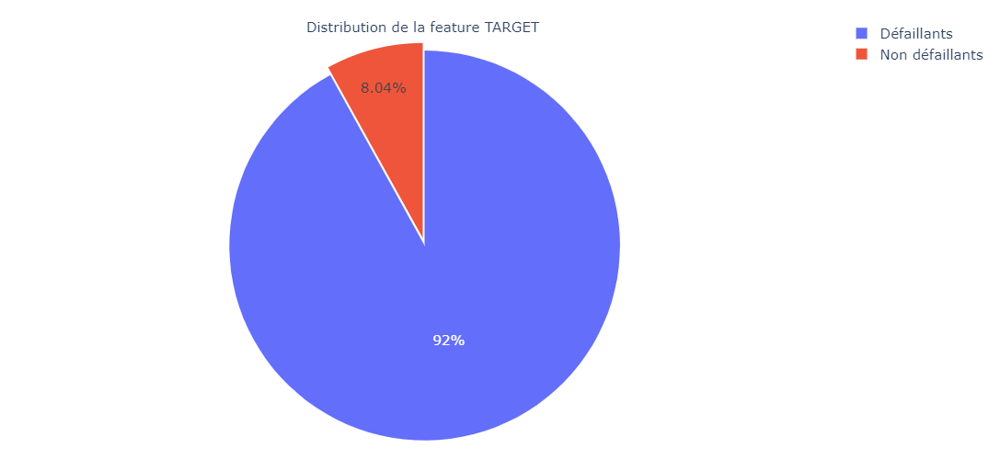

In [45]:
# Distribution Target => Vérifier que la proportion entre Défaillants et Non Défaillants est respectée
target_distribution = train_sample_std_350.TARGET.value_counts()

import plotly.graph_objects as go

labels = ['Non défaillants','Défaillants']
values = [target_distribution[1], target_distribution[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = 'Distribution de la feature TARGET', pull = [0,0.04])])
fig.update_layout(width=500,height=500, font_size = 15, margin = dict ( l = 20 ,  r = 20 ,  t = 20 ,  b = 20 ))
fig.show()

## [5. Réexécuter l'initialisation de la modélisation avec les 350 principales features](#plan)<a class="anchor" id="5"></a>

In [46]:
%time model_setup_350  =  setup ( data = train_sample_std_350 ,  target = 'TARGET', fix_imbalance = True,  ignore_features = ['SK_ID_CURR'], train_size=0.70, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(30000, 352)"
5,Missing Values,False
6,Numeric Features,343
7,Categorical Features,7
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 18.1 s


In [47]:
add_metric('logloss', 'Log Loss', log_loss, greater_is_better = False)

Name                                                       Log Loss
Display Name                                               Log Loss
Score Function            <function log_loss at 0x000002185339D5E0>
Scorer               make_scorer(log_loss, greater_is_better=False)
Target                                                         pred
Args                                                             {}
Greater is Better                                             False
Multiclass                                                     True
Custom                                                         True
Name: logloss, dtype: object

In [48]:
%time best_model_350  =  compare_models (sort = 'AUC', include = ['lightgbm', 'lda', 'ada'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9169,0.7740,0.0587,0.4100,0.1023,0.0840,0.1302,2.8718,4.3570
lda,Linear Discriminant Analysis,0.7343,0.7549,0.6203,0.1766,0.2749,0.1701,0.2207,9.1764,2.5840
ada,Ada Boost Classifier,0.8899,0.7045,0.1385,0.2174,0.1683,0.1129,0.1164,3.8028,15.2390


Wall time: 3min 50s


### **Réexécuter le setup avec ces 350 principales features et avec le jeu complet**

In [49]:
# Jeu complet
display(train_df_std_350.head(2))
print('Shape : ', train_df_std_350.shape)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,...,DAYS_PAYMENT_RATIO_MIN_FIRST_5_INSTALLMENTS,INSTALLMENTS_AMT_PAYMENT_SUM_MAX_INCOME_RATIO,AMT_CREDIT_HOUR_PROCESS_START_SUM_ALL,CHANNEL_TYPE_MEAN_LAST_5,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,INTEREST_SHARE_MIN_ALL,NAME_PAYMENT_TYPE_MEAN_LAST_5,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CHILDREN_INCOME_RATIO,TARGET
0,100002,3.190860,0.449980,0.384462,0.963572,-0.020491,0.113357,-0.498997,-0.023502,-0.548348,...,0.075480,-0.468936,-0.542670,-0.420433,0.091097,0.784658,1.843181,-0.032451,-0.491786,1
1,100003,-0.567492,-1.632332,-0.025011,0.963572,-0.020491,2.030894,-0.498997,-0.023502,-0.548348,...,0.613073,0.515149,0.404742,-0.420433,0.000000,0.559187,-0.076989,-0.032451,-0.491786,0


Shape :  (307507, 352)


In [51]:
%time model_setup_350  =  setup ( data = train_df_std_350 ,  target = 'TARGET', fix_imbalance = True,  ignore_features = ['SK_ID_CURR'], train_size=0.70, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(307507, 352)"
5,Missing Values,False
6,Numeric Features,343
7,Categorical Features,7
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 4min 57s


In [52]:
add_metric('logloss', 'Log Loss', log_loss, greater_is_better = False)

Name                                                       Log Loss
Display Name                                               Log Loss
Score Function            <function log_loss at 0x000002185339D5E0>
Scorer               make_scorer(log_loss, greater_is_better=False)
Target                                                         pred
Args                                                             {}
Greater is Better                                             False
Multiclass                                                     True
Custom                                                         True
Name: logloss, dtype: object

In [53]:
%time best_model_350_all  =  compare_models (sort = 'AUC', include = ['lightgbm', 'lda', 'ada'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9193,0.7895,0.0432,0.5118,0.0796,0.0679,0.1309,2.7862,116.0370
ada,Ada Boost Classifier,0.8874,0.7240,0.1707,0.2325,0.1967,0.1377,0.1397,3.8893,243.5710
lda,Linear Discriminant Analysis,0.2925,0.3124,0.2727,0.0739,0.1163,0.0750,0.0995,3.7137,93.8150


Wall time: 1h 36min 33s


Le fait d'entraîner le jeu entier (307507 raws) est trop consommateur de ressource machines et prend un temps anormalement long sans apporter de performances supérieures par rapport à un jeu de données réduit (30000 raws).

### **Réexécuter le setup avec les 350 principales features sur un jeu réduit non normalisé**

In [57]:
train_df_350 = pd.read_csv('data_pycaret/train_df_350.csv').drop("Unnamed: 0",axis=1)

In [59]:
# Echantillon pour entraînement pycaret
%time train_sample_350 = train_df_350.sample(n=30000, random_state=0)
train_sample_350.head(2)

Wall time: 172 ms


,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,...,DAYS_PAYMENT_RATIO_MIN_FIRST_5_INSTALLMENTS,INSTALLMENTS_AMT_PAYMENT_SUM_MAX_INCOME_RATIO,AMT_CREDIT_HOUR_PROCESS_START_SUM_ALL,CHANNEL_TYPE_MEAN_LAST_5,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,INTEREST_SHARE_MIN_ALL,NAME_PAYMENT_TYPE_MEAN_LAST_5,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CHILDREN_INCOME_RATIO,TARGET
289122,434945,0.056,0.0835,0.08014,0.930,0.412705,0.921,1,0.0,0,...,0.9893,2.234766,3067785.0,2.00,29.0,0.0812,1.5,0.0,0.0,0
188488,318528,0.072,0.0776,0.08010,0.907,0.568536,0.921,1,0.0,0,...,0.9863,3.520026,8490186.0,3.25,36.0,0.3713,1.0,0.0,0.0,0


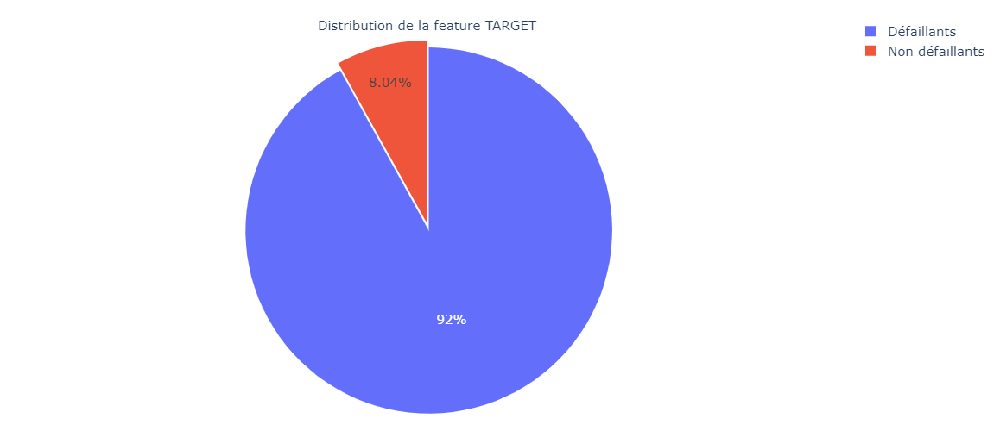

In [60]:
# Distribution Target => Vérifier que la proportion entre Défaillants et Non Défaillants est respectée
target_distribution = train_sample_350.TARGET.value_counts()

import plotly.graph_objects as go

labels = ['Non défaillants','Défaillants']
values = [target_distribution[1], target_distribution[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = 'Distribution de la feature TARGET', pull = [0,0.04])])
fig.update_layout(width=500,height=500, font_size = 15, margin = dict ( l = 20 ,  r = 20 ,  t = 20 ,  b = 20 ))
fig.show()

In [61]:
%time model_setup_50  =  setup ( data = train_sample_350 ,  target = 'TARGET', fix_imbalance = True,  ignore_features = ['SK_ID_CURR'], train_size=0.70, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(30000, 352)"
5,Missing Values,False
6,Numeric Features,341
7,Categorical Features,9
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 18.6 s


In [62]:
%time best_model_350_sample  =  compare_models (sort = 'AUC', include = ['lightgbm', 'lda', 'ada'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9184,0.7752,0.0545,0.4675,0.0972,0.0820,0.1375,4.0230
lda,Linear Discriminant Analysis,0.7412,0.7713,0.6543,0.1871,0.2909,0.1885,0.2442,2.9630
ada,Ada Boost Classifier,0.9014,0.7157,0.1268,0.2737,0.1712,0.1266,0.1381,16.8560


Wall time: 4min 4s


## [6. Entraînement du modèle Lightgbm sur un jeu normalisé avec les 350 features principales](#plan)<a class="anchor" id="6"></a>

**Raisons du choix :** Pour l'Accuracy, l'AUC et le Log Loss

### **Setup**

In [63]:
train_df_std_350 = pd.read_csv('data_pycaret/train_df_std_350.csv').drop("Unnamed: 0",axis=1)
train_df_std_350.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,...,DAYS_PAYMENT_RATIO_MIN_FIRST_5_INSTALLMENTS,INSTALLMENTS_AMT_PAYMENT_SUM_MAX_INCOME_RATIO,AMT_CREDIT_HOUR_PROCESS_START_SUM_ALL,CHANNEL_TYPE_MEAN_LAST_5,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,INTEREST_SHARE_MIN_ALL,NAME_PAYMENT_TYPE_MEAN_LAST_5,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CHILDREN_INCOME_RATIO,TARGET
0,100002,3.190860,0.449980,0.384462,0.963572,-0.020491,0.113357,-0.498997,-0.023502,-0.548348,...,0.075480,-0.468936,-0.542670,-0.420433,0.091097,0.784658,1.843181,-0.032451,-0.491786,1
1,100003,-0.567492,-1.632332,-0.025011,0.963572,-0.020491,2.030894,-0.498997,-0.023502,-0.548348,...,0.613073,0.515149,0.404742,-0.420433,0.000000,0.559187,-0.076989,-0.032451,-0.491786,0


In [64]:
# Echantillon pour entraînement pycaret
%time train_sample_350_lgb = train_df_std_350.sample(n=30000, random_state=0)

Wall time: 181 ms


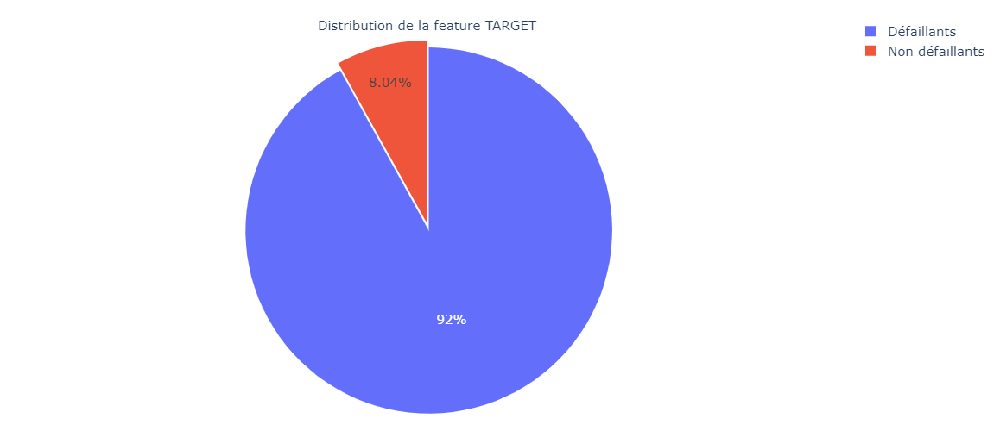

In [65]:
# Distribution Target => Vérifier que la proportion entre Défaillants et Non Défaillants est respectée
target_distribution = train_sample_350_lgb.TARGET.value_counts()

import plotly.graph_objects as go

labels = ['Non défaillants','Défaillants']
values = [target_distribution[1], target_distribution[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = 'Distribution de la feature TARGET', pull = [0,0.04])])
fig.update_layout(width=500,height=500, font_size = 15, margin = dict ( l = 20 ,  r = 20 ,  t = 20 ,  b = 20 ))
fig.show()

In [66]:
%time model_setup_350  =  setup ( data = train_sample_350_lgb ,  target = 'TARGET', fix_imbalance = True,  ignore_features = ['SK_ID_CURR'], train_size=0.70, session_id = 1)

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(30000, 352)"
5,Missing Values,False
6,Numeric Features,343
7,Categorical Features,7
8,Ordinal Features,False
9,High Cardinality Features,False


Wall time: 19.6 s


In [67]:
results_setup_lgb_350 = pull()
results_setup_lgb_350

,Description,Value
0,session_id,1
1,Target,TARGET
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(30000, 352)"
5,Missing Values,False
6,Numeric Features,343
7,Categorical Features,7
8,Ordinal Features,False
9,High Cardinality Features,False


### **Comparaison des modeles**

In [68]:
add_metric('logloss', 'Log Loss', log_loss, greater_is_better = False)

Name                                                       Log Loss
Display Name                                               Log Loss
Score Function            <function log_loss at 0x000002185339D5E0>
Scorer               make_scorer(log_loss, greater_is_better=False)
Target                                                         pred
Args                                                             {}
Greater is Better                                             False
Multiclass                                                     True
Custom                                                         True
Name: logloss, dtype: object

In [69]:
%time best_model_350_sample_lgb  =  compare_models (sort = 'AUC', include = ['lightgbm', 'lda'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9169,0.7740,0.0587,0.4100,0.1023,0.0840,0.1302,2.8718,4.0570
lda,Linear Discriminant Analysis,0.7343,0.7549,0.6203,0.1766,0.2749,0.1701,0.2207,9.1764,2.5770


Wall time: 1min 12s


In [70]:
results_best_model_350_sample_lgb = pull()
results_best_model_350_sample_lgb

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9169,0.7740,0.0587,0.4100,0.1023,0.0840,0.1302,2.8718,4.057
lda,Linear Discriminant Analysis,0.7343,0.7549,0.6203,0.1766,0.2749,0.1701,0.2207,9.1764,2.577


In [71]:
# Sauveagrde
results_best_model_350_sample_lgb.to_csv('results_model_lighgbm/results_best_model_350_sample_lgb.csv')

### **Création du modele lightgbm**

In [72]:
lgb_350 = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9167,0.7628,0.0353,0.3529,0.0642,0.0502,0.0901,2.8782
1,0.9176,0.7787,0.0529,0.4286,0.0942,0.0778,0.1281,2.8453
2,0.9190,0.7724,0.0706,0.5000,0.1237,0.1058,0.1652,2.7960
3,0.9157,0.7676,0.0588,0.3704,0.1015,0.0811,0.1211,2.9111
4,0.9152,0.7738,0.0529,0.3462,0.0918,0.0719,0.1089,2.9276
5,0.9190,0.7934,0.0877,0.5172,0.1500,0.1294,0.1886,2.7960
6,0.9195,0.7872,0.0760,0.5417,0.1333,0.1156,0.1809,2.7796
7,0.9148,0.7848,0.0409,0.3182,0.0725,0.0550,0.0891,2.9440
8,0.9148,0.7745,0.0702,0.3750,0.1182,0.0950,0.1335,2.9440
9,0.9162,0.7453,0.0412,0.3500,0.0737,0.0576,0.0967,2.8961


In [73]:
results_create_lgb_350 = pull()
results_create_lgb_350

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9167,0.7628,0.0353,0.3529,0.0642,0.0502,0.0901,2.8782
1,0.9176,0.7787,0.0529,0.4286,0.0942,0.0778,0.1281,2.8453
2,0.9190,0.7724,0.0706,0.5000,0.1237,0.1058,0.1652,2.7960
3,0.9157,0.7676,0.0588,0.3704,0.1015,0.0811,0.1211,2.9111
4,0.9152,0.7738,0.0529,0.3462,0.0918,0.0719,0.1089,2.9276
5,0.9190,0.7934,0.0877,0.5172,0.1500,0.1294,0.1886,2.7960
6,0.9195,0.7872,0.0760,0.5417,0.1333,0.1156,0.1809,2.7796
7,0.9148,0.7848,0.0409,0.3182,0.0725,0.0550,0.0891,2.9440
8,0.9148,0.7745,0.0702,0.3750,0.1182,0.0950,0.1335,2.9440
9,0.9162,0.7453,0.0412,0.3500,0.0737,0.0576,0.0967,2.8961


In [74]:
# Sauveagrde
results_create_lgb_350.to_csv('results_model_lighgbm/results_create_lgb_350.csv')

### **Optimisation du seuil de classification => paramètre de predict_model**

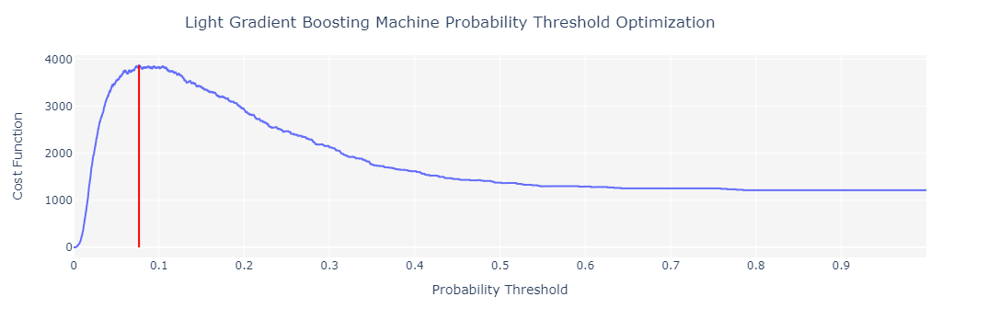

Optimized Probability Threshold: 0.0767 | Optimized Cost Function: 3869


0.0767

In [76]:
optimize_threshold(lgb_350, true_negative = 1, false_negative = -10)

### **Réglage des hyperparamètres du modele lightgbm**

In [77]:
tuned_lgb_350_hyperopt  =  tune_model (lgb_350,  search_library = 'tune-sklearn',search_algorithm = 'hyperopt', n_iter = 10 )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9181,0.7408,0.0294,0.4167,0.0549,0.0447,0.0933,2.8289
1,0.9176,0.7637,0.0294,0.3846,0.0546,0.0436,0.0879,2.8453
2,0.9186,0.7753,0.0353,0.4615,0.0656,0.0547,0.1101,2.8124
3,0.9205,0.7617,0.0529,0.6000,0.0973,0.0853,0.1614,2.7467
4,0.9167,0.7726,0.0353,0.3529,0.0642,0.0502,0.0901,2.8782
5,0.9167,0.7752,0.0234,0.3333,0.0437,0.0334,0.0698,2.8782
6,0.9181,0.7666,0.0175,0.4286,0.0337,0.0275,0.0734,2.8289
7,0.9200,0.7665,0.0351,0.6667,0.0667,0.0590,0.1404,2.7631
8,0.9152,0.7685,0.0351,0.3158,0.0632,0.0476,0.0819,2.9276
9,0.9200,0.7319,0.0235,0.6667,0.0455,0.0402,0.1149,2.7644


In [78]:
print(tuned_lgb_350_hyperopt)

LGBMClassifier(bagging_fraction=0.8949926980748816, bagging_freq=3,
               boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               feature_fraction=0.5381679870432289, importance_type='split',
               learning_rate=0.030261630043347247, max_depth=-1,
               min_child_samples=10, min_child_weight=0.001,
               min_split_gain=0.5782233008102186, n_estimators=121, n_jobs=-1,
               num_leaves=243, objective=None, random_state=1,
               reg_alpha=0.002807108423865945, reg_lambda=4.315756183641146e-08,
               silent=True, subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)


In [79]:
results_tuned_lgb_350_hyperopt = pull()
results_tuned_lgb_350_hyperopt

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9181,0.7408,0.0294,0.4167,0.0549,0.0447,0.0933,2.8289
1,0.9176,0.7637,0.0294,0.3846,0.0546,0.0436,0.0879,2.8453
2,0.9186,0.7753,0.0353,0.4615,0.0656,0.0547,0.1101,2.8124
3,0.9205,0.7617,0.0529,0.6000,0.0973,0.0853,0.1614,2.7467
4,0.9167,0.7726,0.0353,0.3529,0.0642,0.0502,0.0901,2.8782
5,0.9167,0.7752,0.0234,0.3333,0.0437,0.0334,0.0698,2.8782
6,0.9181,0.7666,0.0175,0.4286,0.0337,0.0275,0.0734,2.8289
7,0.9200,0.7665,0.0351,0.6667,0.0667,0.0590,0.1404,2.7631
8,0.9152,0.7685,0.0351,0.3158,0.0632,0.0476,0.0819,2.9276
9,0.9200,0.7319,0.0235,0.6667,0.0455,0.0402,0.1149,2.7644


In [80]:
tuned_lgbm_350_base  =  tune_model (lgb_350)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9195,0.7624,0.0529,0.5294,0.0963,0.0828,0.1485,2.7796
1,0.9157,0.7776,0.0294,0.2941,0.0535,0.0393,0.0706,2.9111
2,0.9190,0.7812,0.0706,0.5000,0.1237,0.1058,0.1652,2.7960
3,0.9186,0.7704,0.0765,0.4815,0.1320,0.1123,0.1676,2.8124
4,0.9200,0.7725,0.0647,0.5500,0.1158,0.1005,0.1686,2.7631
5,0.9181,0.8044,0.0819,0.4828,0.1400,0.1192,0.1736,2.8289
6,0.9190,0.7791,0.0643,0.5238,0.1146,0.0985,0.1626,2.7960
7,0.9214,0.7897,0.0760,0.6500,0.1361,0.1211,0.2039,2.7138
8,0.9138,0.7839,0.0877,0.3750,0.1422,0.1149,0.1496,2.9769
9,0.9176,0.7290,0.0353,0.4000,0.0649,0.0524,0.0992,2.8467


In [84]:
print(tuned_lgbm_350_base)

LGBMClassifier(bagging_fraction=0.9, bagging_freq=2, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.6,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=100, min_child_weight=0.001,
               min_split_gain=0.6, n_estimators=280, n_jobs=-1, num_leaves=70,
               objective=None, random_state=1, reg_alpha=0.1, reg_lambda=0.001,
               silent=True, subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)


In [83]:
results_tuned_lgb_350_base = pull()
results_tuned_lgb_350_base

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9195,0.7624,0.0529,0.5294,0.0963,0.0828,0.1485,2.7796
1,0.9157,0.7776,0.0294,0.2941,0.0535,0.0393,0.0706,2.9111
2,0.9190,0.7812,0.0706,0.5000,0.1237,0.1058,0.1652,2.7960
3,0.9186,0.7704,0.0765,0.4815,0.1320,0.1123,0.1676,2.8124
4,0.9200,0.7725,0.0647,0.5500,0.1158,0.1005,0.1686,2.7631
5,0.9181,0.8044,0.0819,0.4828,0.1400,0.1192,0.1736,2.8289
6,0.9190,0.7791,0.0643,0.5238,0.1146,0.0985,0.1626,2.7960
7,0.9214,0.7897,0.0760,0.6500,0.1361,0.1211,0.2039,2.7138
8,0.9138,0.7839,0.0877,0.3750,0.1422,0.1149,0.1496,2.9769
9,0.9176,0.7290,0.0353,0.4000,0.0649,0.0524,0.0992,2.8467


In [85]:
tuned_lgb_350_optuna  =  tune_model (lgb_350,  search_library = 'tune-sklearn',search_algorithm = 'optuna', n_iter = 10 )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9171,0.7467,0.0294,0.3571,0.0543,0.0426,0.0830,2.8618
1,0.9186,0.7485,0.0471,0.4706,0.0856,0.0719,0.1290,2.8124
2,0.9171,0.7437,0.0647,0.4231,0.1122,0.0928,0.1404,2.8618
3,0.9176,0.7537,0.0471,0.4211,0.0847,0.0695,0.1191,2.8453
4,0.9143,0.7500,0.0471,0.3077,0.0816,0.0615,0.0931,2.9605
5,0.9186,0.7696,0.0643,0.5000,0.1140,0.0972,0.1575,2.8124
6,0.9167,0.7613,0.0468,0.4000,0.0838,0.0679,0.1142,2.8782
7,0.9167,0.7412,0.0409,0.3889,0.0741,0.0595,0.1045,2.8782
8,0.9114,0.7570,0.0351,0.2222,0.0606,0.0393,0.0588,3.0592
9,0.9195,0.7157,0.0471,0.5333,0.0865,0.0743,0.1407,2.7809


In [86]:
print(tuned_lgb_350_optuna)

LGBMClassifier(bagging_fraction=0.5761684890242077, bagging_freq=2,
               boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               feature_fraction=0.9451573018558573, importance_type='split',
               learning_rate=0.01835581291203123, max_depth=-1,
               min_child_samples=13, min_child_weight=0.001,
               min_split_gain=0.7892793284514885, n_estimators=91, n_jobs=-1,
               num_leaves=253, objective=None, random_state=1,
               reg_alpha=1.3661112643598812e-09,
               reg_lambda=8.449456762633663e-06, silent=True, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)


In [88]:
results_tuned_lgb_350_optuma = pull()
results_tuned_lgb_350_optuma

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9171,0.7467,0.0294,0.3571,0.0543,0.0426,0.0830,2.8618
1,0.9186,0.7485,0.0471,0.4706,0.0856,0.0719,0.1290,2.8124
2,0.9171,0.7437,0.0647,0.4231,0.1122,0.0928,0.1404,2.8618
3,0.9176,0.7537,0.0471,0.4211,0.0847,0.0695,0.1191,2.8453
4,0.9143,0.7500,0.0471,0.3077,0.0816,0.0615,0.0931,2.9605
5,0.9186,0.7696,0.0643,0.5000,0.1140,0.0972,0.1575,2.8124
6,0.9167,0.7613,0.0468,0.4000,0.0838,0.0679,0.1142,2.8782
7,0.9167,0.7412,0.0409,0.3889,0.0741,0.0595,0.1045,2.8782
8,0.9114,0.7570,0.0351,0.2222,0.0606,0.0393,0.0588,3.0592
9,0.9195,0.7157,0.0471,0.5333,0.0865,0.0743,0.1407,2.7809


In [89]:
# Sauveagrdes
results_tuned_lgb_350_hyperopt.to_csv('results_model_lighgbm/results_tuned_lgb_350_hyperopt.csv')
results_tuned_lgb_350_optuma.to_csv('results_model_lighgbm/results_tuned_lgb_350_optuma.csv')
results_tuned_lgb_350_base.to_csv('results_model_lighgbm/results_tuned_lgb_350_base.csv')

### **Tracés du modèle lightgbm**

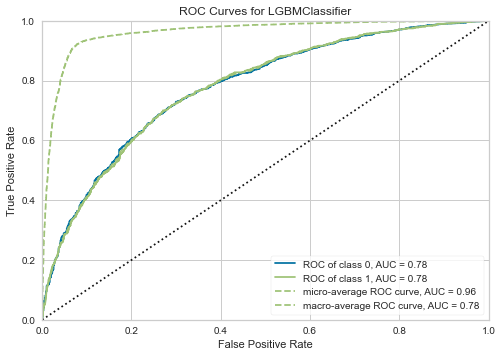

In [91]:
plot_model ( tuned_lgbm_350_base ,  plot  =  'auc' )

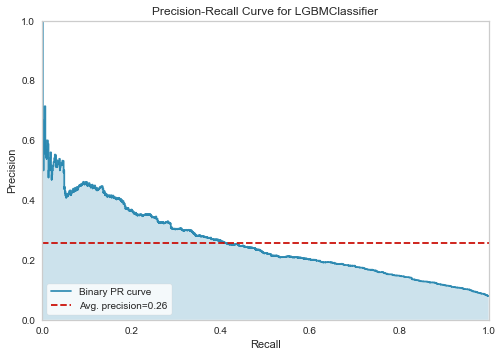

In [92]:
plot_model ( tuned_lgbm_350_base ,  plot  =  'pr' )

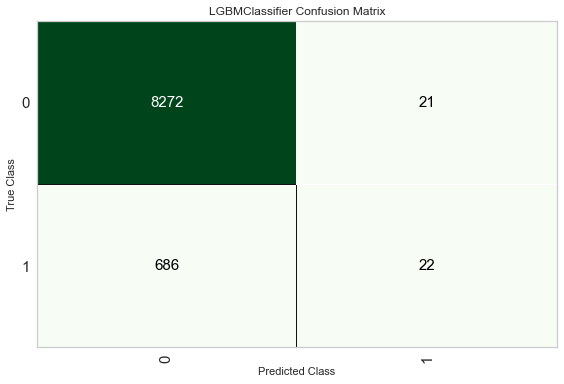

In [93]:
plot_model ( tuned_lgbm_350_base ,  plot  =  'confusion_matrix' )

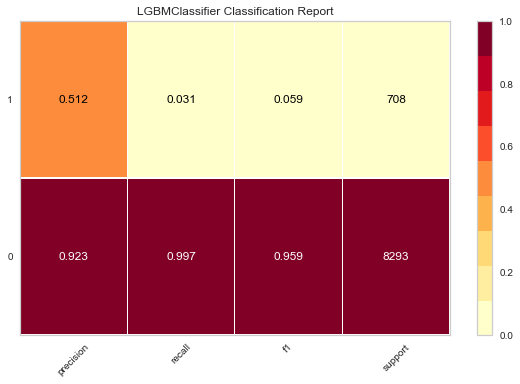

In [94]:
plot_model ( tuned_lgbm_350_base ,  plot  =  'class_report' )

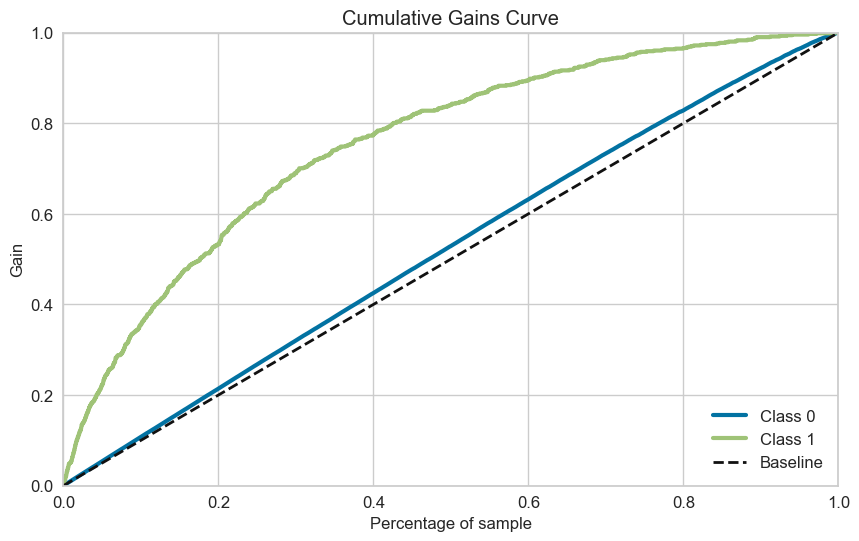

In [95]:
plot_model ( tuned_lgbm_350_base ,  plot  =  'gain' )

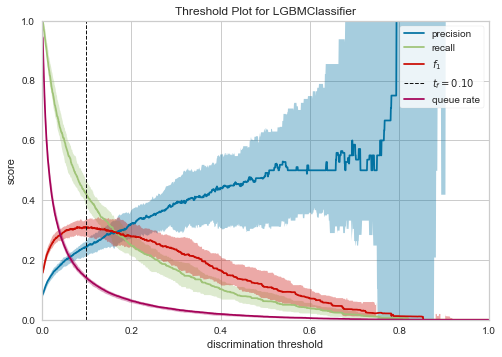

In [96]:
plot_model ( tuned_lgbm_350_base ,  plot  =  'threshold' )

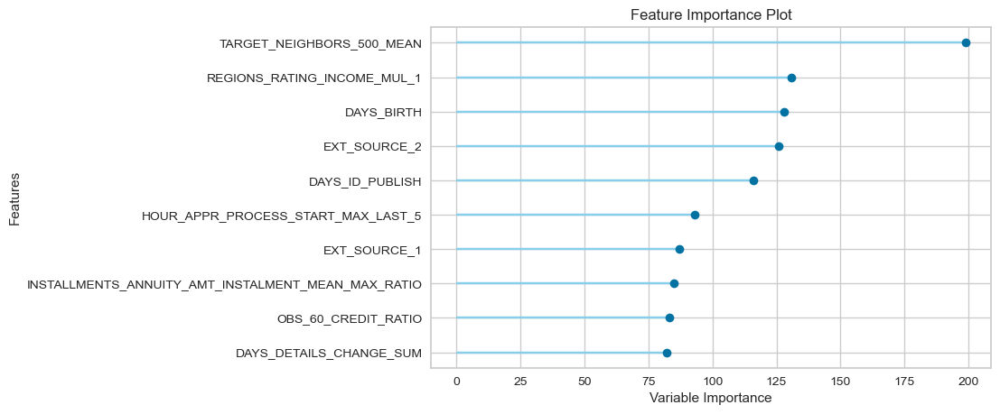

In [97]:
plot_model ( tuned_lgbm_350_base ,  plot  =  'feature' )

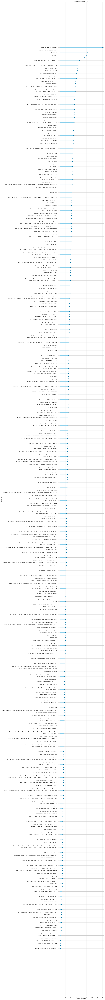

In [98]:
plot_model ( tuned_lgbm_350_base ,  plot  =  'feature_all' )

In [99]:
plot_model ( tuned_lgbm_350_base ,  plot  =  'parameter' )

,Parameters
boosting_type,gbdt
class_weight,None
colsample_bytree,1.0
importance_type,split
learning_rate,0.1
max_depth,-1
min_child_samples,100
min_child_weight,0.001
min_split_gain,0.6
n_estimators,280


### **Interprétation du modèle lightgbm**

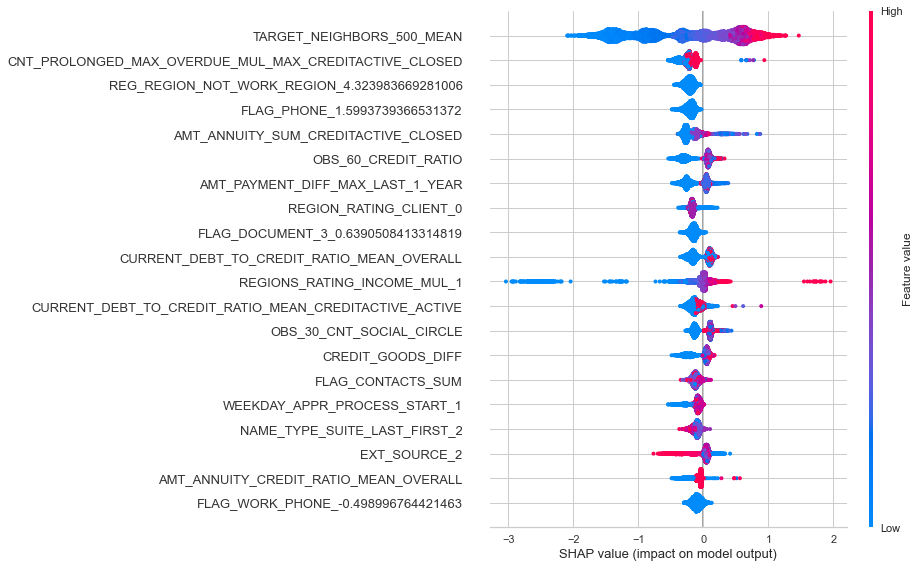

In [100]:
interpret_model(tuned_lgbm_350_base)

In [101]:
interpret_model(tuned_lgbm_350_base, plot = 'reason', observation = 10)

In [ ]:
interpret_model(tuned_lgbm_350_base, plot = 'pfi')

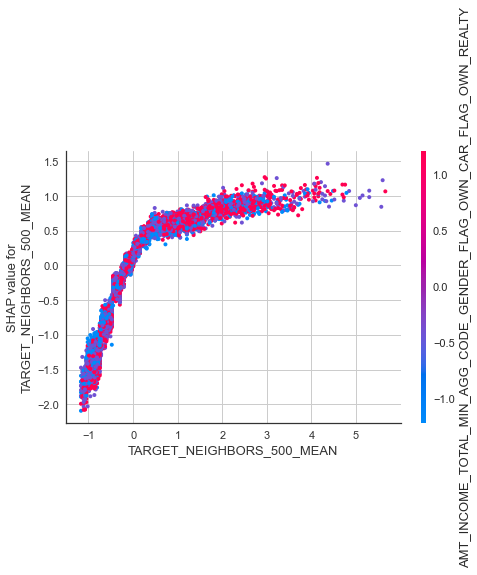

In [102]:
interpret_model(tuned_lgbm_350_base, plot = 'correlation')

### **Finalisation du modèle lightgbm**

In [103]:
final_lghtgbm_350  =  finalize_model ( tuned_lgbm_350_base )

In [104]:
results_final_lightgbm_350 = pull()
results_final_lightgbm_350

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.9171,0.7467,0.0294,0.3571,0.0543,0.0426,0.0830,2.8618
1,0.9186,0.7485,0.0471,0.4706,0.0856,0.0719,0.1290,2.8124
2,0.9171,0.7437,0.0647,0.4231,0.1122,0.0928,0.1404,2.8618
3,0.9176,0.7537,0.0471,0.4211,0.0847,0.0695,0.1191,2.8453
4,0.9143,0.7500,0.0471,0.3077,0.0816,0.0615,0.0931,2.9605
5,0.9186,0.7696,0.0643,0.5000,0.1140,0.0972,0.1575,2.8124
6,0.9167,0.7613,0.0468,0.4000,0.0838,0.0679,0.1142,2.8782
7,0.9167,0.7412,0.0409,0.3889,0.0741,0.0595,0.1045,2.8782
8,0.9114,0.7570,0.0351,0.2222,0.0606,0.0393,0.0588,3.0592
9,0.9195,0.7157,0.0471,0.5333,0.0865,0.0743,0.1407,2.7809


In [105]:
results_final_lightgbm_350.to_csv('results_model_lighgbm/results_final_lightgbm_350.csv')

In [106]:
print(final_lghtgbm_350)

LGBMClassifier(bagging_fraction=0.9, bagging_freq=2, boosting_type='gbdt',
               class_weight=None, colsample_bytree=1.0, feature_fraction=0.6,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=100, min_child_weight=0.001,
               min_split_gain=0.6, n_estimators=280, n_jobs=-1, num_leaves=70,
               objective=None, random_state=1, reg_alpha=0.1, reg_lambda=0.001,
               silent=True, subsample=1.0, subsample_for_bin=200000,
               subsample_freq=0)


### **Prédire avec le modèle lightgbm sur le holdout du jeu d'entraînement (30 %)**

In [107]:
pred_lightgbm_holdout_350 = predict_model ( final_lghtgbm_350 )
pred_lightgbm_holdout_350

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,Light Gradient Boosting Machine,0.9987,1.0000,0.9831,1.0000,0.9915,0.9907,0.9908,0.0460


,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,CREDIT_EXT_RATIO,OBS_60_CREDIT_RATIO,...,FLAG_WORK_PHONE_-0.498996764421463,FLAG_DOCUMENT_3_0.6390508413314819,FLAG_PHONE_1.5993739366531372,LIVE_CITY_NOT_WORK_CITY_-0.46781787276268005,REG_REGION_NOT_WORK_REGION_4.323983669281006,CNT_NON_CHILDREN_0.5995169281959534,REG_CITY_NOT_LIVE_CITY_-0.2912099361419678,TARGET,Label,Score
0,0.063911,1.439078,-0.339929,-1.033695,-0.020491,0.113357,-0.023502,-0.548348,-0.024533,1.790062,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.9701
1,0.244312,-0.976404,0.708083,-1.033695,-0.020491,0.113357,-0.023502,3.139508,-0.049186,0.408700,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.9287
2,-0.958361,0.397922,-0.581261,0.963572,-0.020491,0.113357,0.000000,-0.548348,-0.023991,3.788198,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.9992
3,-0.537425,1.439078,-0.025011,0.963572,0.000000,0.113357,0.000000,-0.548348,-0.049533,-0.763736,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.9717
4,0.575047,1.439078,-0.489476,0.963572,-0.020491,0.113357,-0.023502,-0.548348,-0.065930,-0.763751,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1,1,0.7332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8996,-0.086423,-1.632332,0.123744,-1.033695,-0.020491,0.113357,0.000000,1.295580,-0.058520,-0.763747,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.9801
8997,-0.838094,1.439078,0.188627,0.963572,0.000000,0.113357,-0.023502,-0.548348,-0.046441,-0.763728,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.9989
8998,0.484846,0.397922,0.384462,0.963572,0.000000,0.113357,0.000000,-0.548348,-0.049795,-0.763746,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.9821
8999,0.184178,-1.632332,0.037102,-1.033695,-0.020491,0.113357,-0.023502,-0.548348,0.024908,3.457076,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.9883


In [108]:
results_pred_lightgbm_holdout_350 = pull()
results_pred_lightgbm_holdout_350

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,Light Gradient Boosting Machine,0.9987,1.0,0.9831,1.0,0.9915,0.9907,0.9908,0.046


In [109]:
results_pred_lightgbm_holdout_350.to_csv('results_model_lighgbm/results_pred_lightgbm_holdout_350.csv')

### **Prédictions avec le modèle lightgbm sur le unseen_data**

In [110]:
test_df_std_350 = pd.read_csv('data_pycaret/test_df_std_350.csv').drop("Unnamed: 0",axis=1)
test_df_std_350.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,...,DAYS_FIRST_DUE_MAX_ALL,DAYS_PAYMENT_RATIO_MIN_FIRST_5_INSTALLMENTS,INSTALLMENTS_AMT_PAYMENT_SUM_MAX_INCOME_RATIO,AMT_CREDIT_HOUR_PROCESS_START_SUM_ALL,CHANNEL_TYPE_MEAN_LAST_5,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,INTEREST_SHARE_MIN_ALL,NAME_PAYMENT_TYPE_MEAN_LAST_5,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CHILDREN_INCOME_RATIO
0,100001,-0.285805,1.362144,-0.069788,0.928229,-0.032632,0.083711,-0.507337,0.0,-0.537128,...,-1.967520,0.611481,-0.730938,-0.644754,-1.451316,0.0,1.016121,-1.159899,-0.044103,-0.48983
1,100005,0.494892,0.343595,0.267753,-1.073187,-0.032632,0.083711,-0.507337,0.0,-0.537128,...,-0.167845,-0.060647,-0.630161,-0.638017,-0.468492,0.0,1.203510,0.291131,-0.044103,-0.48983


In [112]:
# Echantillon 
%time test_sample_350_lgb = test_df_std_350.sample(n=30000, random_state=0)

Wall time: 53 ms


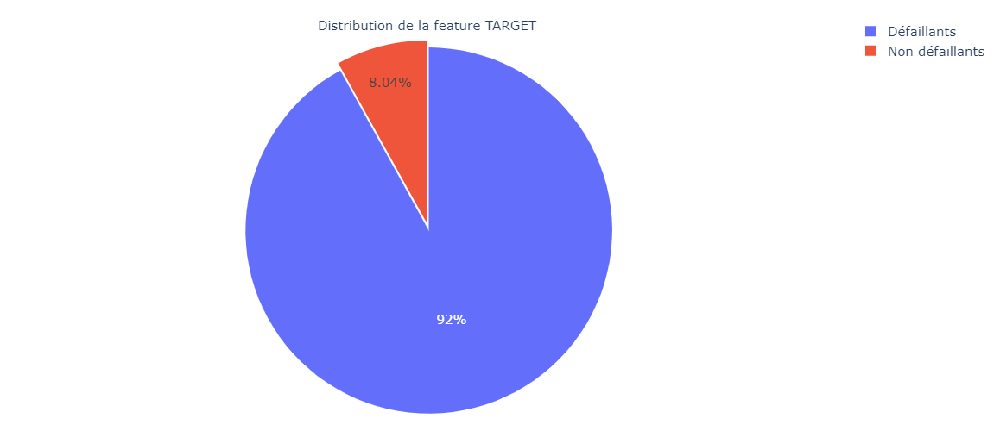

In [113]:
# Distribution Target => Vérifier que la proportion entre Défaillants et Non Défaillants est respectée
target_distribution = train_sample_350_lgb.TARGET.value_counts()

import plotly.graph_objects as go

labels = ['Non défaillants','Défaillants']
values = [target_distribution[1], target_distribution[0]]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, title = 'Distribution de la feature TARGET', pull = [0,0.04])])
fig.update_layout(width=500,height=500, font_size = 15, margin = dict ( l = 20 ,  r = 20 ,  t = 20 ,  b = 20 ))
fig.show()

In [115]:
unseen_predictions_lightgbm_350  =  predict_model ( final_lghtgbm_350, probability_threshold = 0.0767, data = test_df_std_350 ) 
unseen_predictions_lightgbm_350.head()

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,...,INSTALLMENTS_AMT_PAYMENT_SUM_MAX_INCOME_RATIO,AMT_CREDIT_HOUR_PROCESS_START_SUM_ALL,CHANNEL_TYPE_MEAN_LAST_5,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,INTEREST_SHARE_MIN_ALL,NAME_PAYMENT_TYPE_MEAN_LAST_5,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CHILDREN_INCOME_RATIO,Label,Score
0,100001,-0.285805,1.362144,-0.069788,0.928229,-0.032632,0.083711,-0.507337,0.000000,-0.537128,...,-0.730938,-0.644754,-1.451316,0.000000,1.016121,-1.159899,-0.044103,-0.489830,1,0.9997
1,100005,0.494892,0.343595,0.267753,-1.073187,-0.032632,0.083711,-0.507337,0.000000,-0.537128,...,-0.630161,-0.638017,-0.468492,0.000000,1.203510,0.291131,-0.044103,-0.489830,1,0.9998
2,100013,-1.160186,-1.642575,0.543116,-1.073187,0.000000,0.083711,-0.507337,-0.018016,-0.537128,...,0.239835,-0.296341,0.514331,-0.891358,0.751621,-0.434384,-0.044103,-0.489830,1,0.9666
3,100028,-0.879135,0.394523,-0.902390,0.928229,-0.032632,0.083711,-0.507337,-0.018016,-0.537128,...,-0.534326,-0.410146,-0.075363,-0.785395,-1.255976,0.000925,-0.044103,0.676184,1,0.9996
4,100038,0.619804,0.343595,0.023184,-1.073187,0.000000,0.083711,1.971078,0.000000,1.276328,...,-0.580513,-0.460612,1.005743,0.000000,1.203510,1.742161,-0.044103,0.519501,1,0.9993


In [116]:
unseen_predictions_lightgbm_350.Label.value_counts()

1    48727
0       17
Name: Label, dtype: int64

In [117]:
unseen_predictions_lightgbm_350.to_csv('results_model_lighgbm/unseen_predictions_lightgbm.csv')

In [118]:
# from pycaret.utils import check_metric
# AUC = check_metric(unseen_predictions_lightgbm['TARGET'], unseen_predictions_lightgbm['Label'], metric = 'AUC')
# Accuracy = check_metric(unseen_predictions_lightgbm['TARGET'], unseen_predictions_lightgbm['Label'], metric = 'Accuracy')
# F1 = check_metric(unseen_predictions_lightgbm['TARGET'], unseen_predictions_lightgbm['Label'], metric = 'F1')
# Recall = check_metric(unseen_predictions_lightgbm['TARGET'], unseen_predictions_lightgbm['Label'], metric = 'Recall')

# print('AUC : ', AUC)
# print('Accuracy : ', Accuracy)
# print('F1 : ', F1)
# print('Recall : ', Recall)

### **Sauvegarde du modèle lightgbm**

In [119]:
save_model ( final_lghtgbm_350 ,  'Save_Model/Final LightGbm_350 Model 04oct2021' )

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True,
                                       features_todrop=['SK_ID_CURR'],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 n...
                                 boosting_type='gbdt', class_weight=None,
                                 colsample_bytree=1.0, feature_fraction=0.6,
                                 importance_type='split', learning_rate=0.1,
       

## [7. Entraînement du modèle Linear Discriminant Analysis (LDA) sur un jeu normalisé avec les 350 features principales](#plan)<a class="anchor" id="7"></a>

**Raisons du choix :** Pour l'AUC, le F1-Score et le temps de traitement.

### **Création du modèle Linéar Discriminant Analysis**

In [122]:
lda_350 = create_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7262,0.7367,0.6000,0.1675,0.2619,0.1549,0.2028,9.4572
1,0.7386,0.7531,0.6235,0.1794,0.2786,0.1748,0.2258,9.0296
2,0.7233,0.7496,0.6118,0.1680,0.2636,0.1565,0.2064,9.5559
3,0.7219,0.7552,0.6176,0.1683,0.2645,0.1573,0.2081,9.6053
4,0.7362,0.7639,0.6529,0.1832,0.2861,0.1828,0.2387,9.1118
5,0.7424,0.7822,0.6842,0.1937,0.3019,0.2005,0.2609,8.8980
6,0.7462,0.7616,0.5965,0.1802,0.2768,0.1734,0.2194,8.7664
7,0.7486,0.7538,0.6082,0.1841,0.2826,0.1801,0.2277,8.6842
8,0.7357,0.7655,0.6316,0.1800,0.2802,0.1757,0.2279,9.1283
9,0.7242,0.7273,0.5765,0.1620,0.2529,0.1448,0.1889,9.5276


In [124]:
results_create_lda_350 = pull()
results_create_lda_350

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7262,0.7367,0.6000,0.1675,0.2619,0.1549,0.2028,9.4572
1,0.7386,0.7531,0.6235,0.1794,0.2786,0.1748,0.2258,9.0296
2,0.7233,0.7496,0.6118,0.1680,0.2636,0.1565,0.2064,9.5559
3,0.7219,0.7552,0.6176,0.1683,0.2645,0.1573,0.2081,9.6053
4,0.7362,0.7639,0.6529,0.1832,0.2861,0.1828,0.2387,9.1118
5,0.7424,0.7822,0.6842,0.1937,0.3019,0.2005,0.2609,8.8980
6,0.7462,0.7616,0.5965,0.1802,0.2768,0.1734,0.2194,8.7664
7,0.7486,0.7538,0.6082,0.1841,0.2826,0.1801,0.2277,8.6842
8,0.7357,0.7655,0.6316,0.1800,0.2802,0.1757,0.2279,9.1283
9,0.7242,0.7273,0.5765,0.1620,0.2529,0.1448,0.1889,9.5276


In [125]:
# Sauveagrde
results_create_lda_350.to_csv('results_model_lda/results_create_lda_350.csv')

### **Optimisation du seuil de classification => Paramètre de Predict_model**

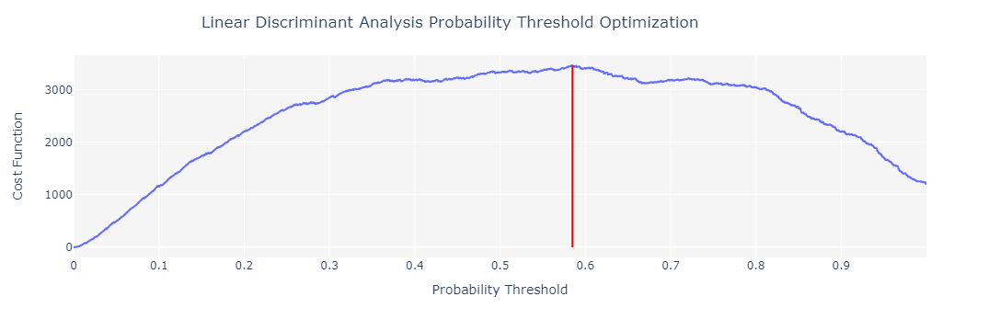

Optimized Probability Threshold: 0.5849 | Optimized Cost Function: 3463


0.5849

In [126]:
optimize_threshold(lda_350, true_negative = 1, false_negative = -10)

### **Réglage des hyperparamètres du modèle Linéar Discriminant Analysis**

In [127]:
tuned_lda_350_base  =  tune_model (lda_350)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7262,0.7367,0.6000,0.1675,0.2619,0.1549,0.2028,9.4572
1,0.7386,0.7531,0.6235,0.1794,0.2786,0.1748,0.2258,9.0296
2,0.7233,0.7496,0.6118,0.1680,0.2636,0.1565,0.2064,9.5559
3,0.7219,0.7552,0.6176,0.1683,0.2645,0.1573,0.2081,9.6053
4,0.7362,0.7640,0.6529,0.1832,0.2861,0.1828,0.2387,9.1118
5,0.7424,0.7822,0.6842,0.1937,0.3019,0.2005,0.2609,8.8980
6,0.7462,0.7616,0.5965,0.1802,0.2768,0.1734,0.2194,8.7664
7,0.7486,0.7538,0.6082,0.1841,0.2826,0.1801,0.2277,8.6842
8,0.7357,0.7654,0.6316,0.1800,0.2802,0.1757,0.2279,9.1283
9,0.7242,0.7273,0.5765,0.1620,0.2529,0.1448,0.1889,9.5276


In [128]:
results_tuned_lda_350_base = pull()
results_tuned_lda_350_base

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7262,0.7367,0.6000,0.1675,0.2619,0.1549,0.2028,9.4572
1,0.7386,0.7531,0.6235,0.1794,0.2786,0.1748,0.2258,9.0296
2,0.7233,0.7496,0.6118,0.1680,0.2636,0.1565,0.2064,9.5559
3,0.7219,0.7552,0.6176,0.1683,0.2645,0.1573,0.2081,9.6053
4,0.7362,0.7640,0.6529,0.1832,0.2861,0.1828,0.2387,9.1118
5,0.7424,0.7822,0.6842,0.1937,0.3019,0.2005,0.2609,8.8980
6,0.7462,0.7616,0.5965,0.1802,0.2768,0.1734,0.2194,8.7664
7,0.7486,0.7538,0.6082,0.1841,0.2826,0.1801,0.2277,8.6842
8,0.7357,0.7654,0.6316,0.1800,0.2802,0.1757,0.2279,9.1283
9,0.7242,0.7273,0.5765,0.1620,0.2529,0.1448,0.1889,9.5276


In [97]:
print(tuned_lda_350_base)

LogisticRegression(C=0.118, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=1, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


In [129]:
# Sauveagrdes
results_tuned_lda_350_base.to_csv('results_model_lda/results_tuned_lda_350_base.csv')

### **Tracés du modèle Linéar Discriminant Analysis**

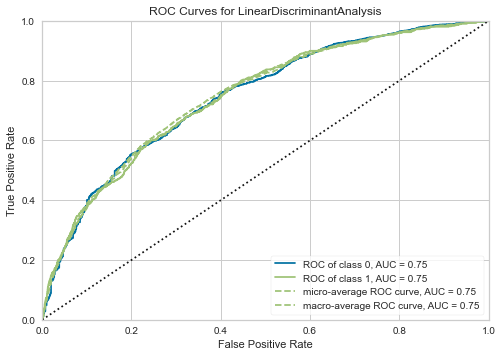

In [130]:
plot_model ( tuned_lda_350_base ,  plot  =  'auc' )

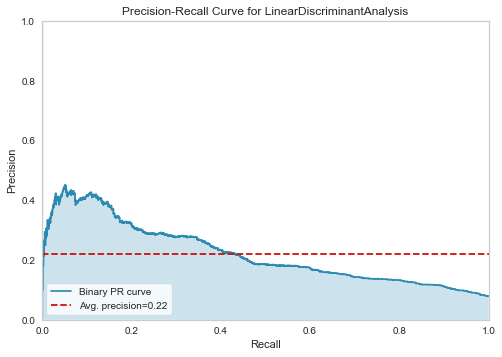

In [131]:
plot_model ( tuned_lda_350_base ,  plot  =  'pr' )

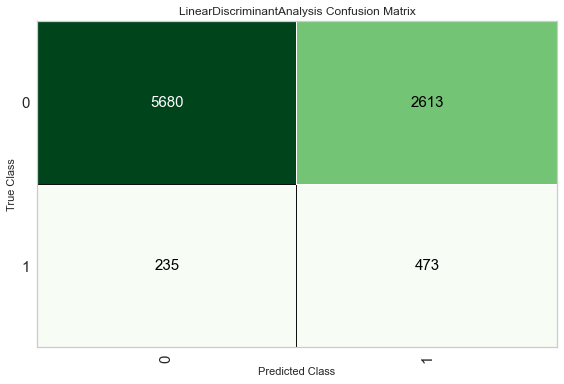

In [132]:
plot_model ( tuned_lda_350_base ,  plot  =  'confusion_matrix' )

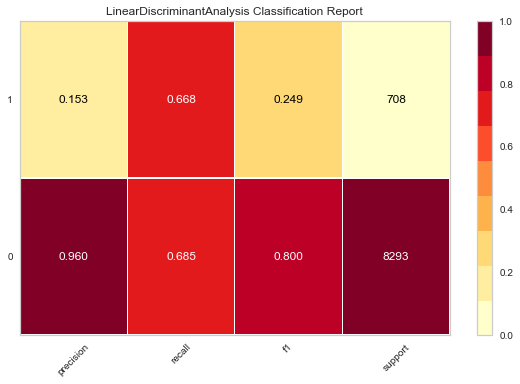

In [133]:
plot_model ( tuned_lda_350_base ,  plot  =  'class_report' )

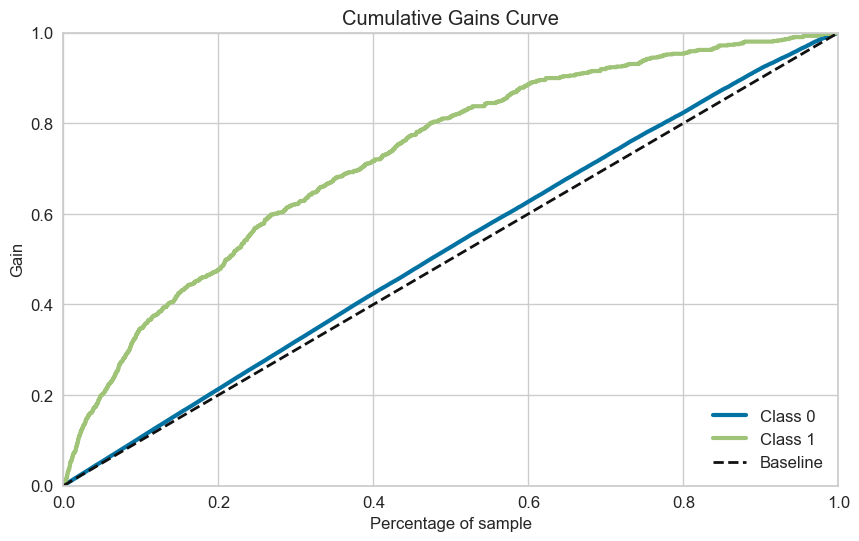

In [134]:
plot_model ( tuned_lda_350_base ,  plot  =  'gain' )

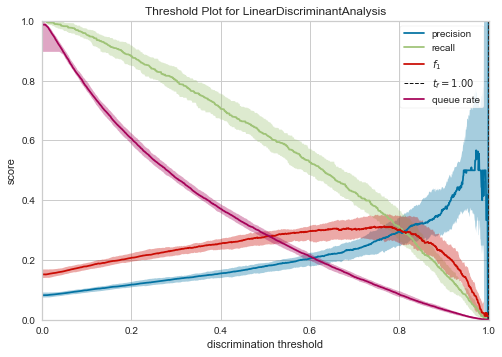

In [135]:
plot_model ( tuned_lda_350_base ,  plot  =  'threshold' )

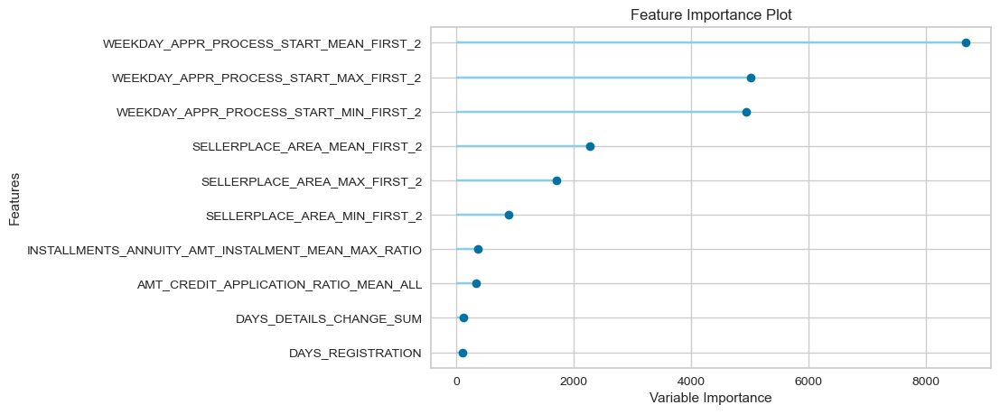

In [136]:
plot_model ( tuned_lda_350_base ,  plot  =  'feature' )

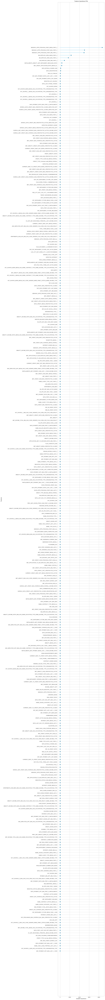

In [137]:
plot_model ( tuned_lda_350_base ,  plot  =  'feature_all' )

In [138]:
plot_model ( tuned_lda_350_base ,  plot  =  'parameter' )

,Parameters
n_components,None
priors,None
shrinkage,empirical
solver,lsqr
store_covariance,False
tol,0.0001


### **Interprétation du modèle Linéar Discriminant Analysis**

Non disponible dans la librairie Pycaret

In [ ]:
interpret_model(tuned_lda_350_base)

In [ ]:
interpret_model(tuned_lda_350_base, plot = 'reason', observation = 10)

In [ ]:
interpret_model(tuned_lda_350_base, plot = 'summary')

In [ ]:
interpret_model(tuned_lda_350_base, plot = 'pfi')

In [ ]:
interpret_model(tuned_lda_350_base, plot = 'correlation')

### **Finalisation du modèle Linéar Discriminant Analysis**

In [140]:
final_lda_350  =  finalize_model ( tuned_lda_350_base )

In [141]:
results_final_lda_350 = pull()
results_final_lda_350

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,0.7262,0.7367,0.6000,0.1675,0.2619,0.1549,0.2028,9.4572
1,0.7386,0.7531,0.6235,0.1794,0.2786,0.1748,0.2258,9.0296
2,0.7233,0.7496,0.6118,0.1680,0.2636,0.1565,0.2064,9.5559
3,0.7219,0.7552,0.6176,0.1683,0.2645,0.1573,0.2081,9.6053
4,0.7362,0.7640,0.6529,0.1832,0.2861,0.1828,0.2387,9.1118
5,0.7424,0.7822,0.6842,0.1937,0.3019,0.2005,0.2609,8.8980
6,0.7462,0.7616,0.5965,0.1802,0.2768,0.1734,0.2194,8.7664
7,0.7486,0.7538,0.6082,0.1841,0.2826,0.1801,0.2277,8.6842
8,0.7357,0.7654,0.6316,0.1800,0.2802,0.1757,0.2279,9.1283
9,0.7242,0.7273,0.5765,0.1620,0.2529,0.1448,0.1889,9.5276


In [142]:
results_final_lda_350.to_csv('results_model_logistic/results_final_lda_350.csv')

In [143]:
print(final_lda_350)

LinearDiscriminantAnalysis(n_components=None, priors=None,
                           shrinkage='empirical', solver='lsqr',
                           store_covariance=False, tol=0.0001)


### **Prédire avec le modèle logistic regression sur le holdout du jeu d'entraînement (30 %)**

In [144]:
pred_lda_350_holdout = predict_model ( final_lda_350 )
pred_lda_350_holdout

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,Linear Discriminant Analysis,0.7411,0.7920,0.6879,0.1876,0.2948,0.1953,0.2576,8.9409


,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,CREDIT_EXT_RATIO,OBS_60_CREDIT_RATIO,...,FLAG_WORK_PHONE_-0.498996764421463,FLAG_DOCUMENT_3_0.6390508413314819,FLAG_PHONE_1.5993739366531372,LIVE_CITY_NOT_WORK_CITY_-0.46781787276268005,REG_REGION_NOT_WORK_REGION_4.323983669281006,CNT_NON_CHILDREN_0.5995169281959534,REG_CITY_NOT_LIVE_CITY_-0.2912099361419678,TARGET,Label,Score
0,0.063911,1.439078,-0.339929,-1.033695,-0.020491,0.113357,-0.023502,-0.548348,-0.024533,1.790062,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,1,0.6798
1,0.244312,-0.976404,0.708083,-1.033695,-0.020491,0.113357,-0.023502,3.139508,-0.049186,0.408700,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,1,0.7225
2,-0.958361,0.397922,-0.581261,0.963572,-0.020491,0.113357,0.000000,-0.548348,-0.023991,3.788198,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.9855
3,-0.537425,1.439078,-0.025011,0.963572,0.000000,0.113357,0.000000,-0.548348,-0.049533,-0.763736,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,1,0.5900
4,0.575047,1.439078,-0.489476,0.963572,-0.020491,0.113357,-0.023502,-0.548348,-0.065930,-0.763751,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1,0,0.6926
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8996,-0.086423,-1.632332,0.123744,-1.033695,-0.020491,0.113357,0.000000,1.295580,-0.058520,-0.763747,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.6999
8997,-0.838094,1.439078,0.188627,0.963572,0.000000,0.113357,-0.023502,-0.548348,-0.046441,-0.763728,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.9350
8998,0.484846,0.397922,0.384462,0.963572,0.000000,0.113357,0.000000,-0.548348,-0.049795,-0.763746,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.5412
8999,0.184178,-1.632332,0.037102,-1.033695,-0.020491,0.113357,-0.023502,-0.548348,0.024908,3.457076,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0.9040


In [145]:
results_pred_lda_350_holdout = pull()
results_pred_lda_350_holdout

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,Log Loss
0,Linear Discriminant Analysis,0.7411,0.792,0.6879,0.1876,0.2948,0.1953,0.2576,8.9409


In [147]:
results_final_lda_350.to_csv('results_model_lda/results_pred_lda_350_holdout.csv')

### **Prédictions avec le modèle Linéar Discriminant Analysis sur le unseen_data**

In [148]:
test_df_std_350 = pd.read_csv('data_pycaret/test_df_std_350.csv').drop("Unnamed: 0",axis=1)
test_df_std_350.head(2)

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,...,DAYS_FIRST_DUE_MAX_ALL,DAYS_PAYMENT_RATIO_MIN_FIRST_5_INSTALLMENTS,INSTALLMENTS_AMT_PAYMENT_SUM_MAX_INCOME_RATIO,AMT_CREDIT_HOUR_PROCESS_START_SUM_ALL,CHANNEL_TYPE_MEAN_LAST_5,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,INTEREST_SHARE_MIN_ALL,NAME_PAYMENT_TYPE_MEAN_LAST_5,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CHILDREN_INCOME_RATIO
0,100001,-0.285805,1.362144,-0.069788,0.928229,-0.032632,0.083711,-0.507337,0.0,-0.537128,...,-1.967520,0.611481,-0.730938,-0.644754,-1.451316,0.0,1.016121,-1.159899,-0.044103,-0.48983
1,100005,0.494892,0.343595,0.267753,-1.073187,-0.032632,0.083711,-0.507337,0.0,-0.537128,...,-0.167845,-0.060647,-0.630161,-0.638017,-0.468492,0.0,1.203510,0.291131,-0.044103,-0.48983


In [149]:
# Echantillon 
%time test_sample_350_lda = test_df_std_350.sample(n=30000, random_state=0)

Wall time: 58.9 ms


In [152]:
unseen_predictions_lda_350  =  predict_model ( final_lda_350 ,  probability_threshold = 0.5849 , data = test_df_std_350 ) 
unseen_predictions_lda_350.head()

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,...,INSTALLMENTS_AMT_PAYMENT_SUM_MAX_INCOME_RATIO,AMT_CREDIT_HOUR_PROCESS_START_SUM_ALL,CHANNEL_TYPE_MEAN_LAST_5,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,INTEREST_SHARE_MIN_ALL,NAME_PAYMENT_TYPE_MEAN_LAST_5,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CHILDREN_INCOME_RATIO,Label,Score
0,100001,-0.285805,1.362144,-0.069788,0.928229,-0.032632,0.083711,-0.507337,0.000000,-0.537128,...,-0.730938,-0.644754,-1.451316,0.000000,1.016121,-1.159899,-0.044103,-0.489830,1,1.0000
1,100005,0.494892,0.343595,0.267753,-1.073187,-0.032632,0.083711,-0.507337,0.000000,-0.537128,...,-0.630161,-0.638017,-0.468492,0.000000,1.203510,0.291131,-0.044103,-0.489830,0,1.0000
2,100013,-1.160186,-1.642575,0.543116,-1.073187,0.000000,0.083711,-0.507337,-0.018016,-0.537128,...,0.239835,-0.296341,0.514331,-0.891358,0.751621,-0.434384,-0.044103,-0.489830,0,1.0000
3,100028,-0.879135,0.394523,-0.902390,0.928229,-0.032632,0.083711,-0.507337,-0.018016,-0.537128,...,-0.534326,-0.410146,-0.075363,-0.785395,-1.255976,0.000925,-0.044103,0.676184,0,0.9934
4,100038,0.619804,0.343595,0.023184,-1.073187,0.000000,0.083711,1.971078,0.000000,1.276328,...,-0.580513,-0.460612,1.005743,0.000000,1.203510,1.742161,-0.044103,0.519501,1,1.0000


In [155]:
unseen_predictions_lda_350.Label.value_counts()

0    26324
1    22420
Name: Label, dtype: int64

In [156]:
unseen_predictions_lda_350.to_csv('results_model_lda/unseen_predictions_lda_350.csv')

### **Sauvegarde du modèle Linéar Discriminant Analysis**

In [157]:
save_model ( final_lda_350 ,  'Save_Model/Final LDA_350 Model 04oct2021' )

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True,
                                       features_todrop=['SK_ID_CURR'],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='TARGET',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 n...
                 ('dummy', Dummify(target='TARGET')),
                 ('fix_perfect', Remove_100(target='TARGET')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi

### **Essai de prédiction sur 1 client (saisie de son SK_ID_CURR)**

In [167]:
essai = test_df_std_350[test_df_std_350['SK_ID_CURR'] == 100005]

In [168]:
essai

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,...,DAYS_FIRST_DUE_MAX_ALL,DAYS_PAYMENT_RATIO_MIN_FIRST_5_INSTALLMENTS,INSTALLMENTS_AMT_PAYMENT_SUM_MAX_INCOME_RATIO,AMT_CREDIT_HOUR_PROCESS_START_SUM_ALL,CHANNEL_TYPE_MEAN_LAST_5,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,INTEREST_SHARE_MIN_ALL,NAME_PAYMENT_TYPE_MEAN_LAST_5,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CHILDREN_INCOME_RATIO
1,100005,0.494892,0.343595,0.267753,-1.073187,-0.032632,0.083711,-0.507337,0.0,-0.537128,...,-0.167845,-0.060647,-0.630161,-0.638017,-0.468492,0.0,1.20351,0.291131,-0.044103,-0.48983


In [169]:
unseen_essai_lda  =  predict_model ( final_lda_350 ,  probability_threshold = 0.5849 , data = essai ) 
unseen_essai_lda.head()

,SK_ID_CURR,TARGET_NEIGHBORS_500_MEAN,WEEKDAY_APPR_PROCESS_START_1,REGIONS_RATING_INCOME_MUL_1,EMERGENCYSTATE_MODE_0,CURRENT_DEBT_TO_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE,REGION_RATING_CLIENT_0,FLAG_WORK_PHONE,CNT_PROLONGED_MAX_OVERDUE_MUL_MAX_CREDITACTIVE_CLOSED,FLAG_REGIONS,...,INSTALLMENTS_AMT_PAYMENT_SUM_MAX_INCOME_RATIO,AMT_CREDIT_HOUR_PROCESS_START_SUM_ALL,CHANNEL_TYPE_MEAN_LAST_5,DAYS_PAYMENT_DIFF_MAX_LAST_1_YEAR,INTEREST_SHARE_MIN_ALL,NAME_PAYMENT_TYPE_MEAN_LAST_5,MISSING_VALS_TOTAL_INSTAL_SUM_SUM,CHILDREN_INCOME_RATIO,Label,Score
1,100005,0.494892,0.343595,0.267753,-1.073187,-0.032632,0.083711,-0.507337,0.0,-0.537128,...,-0.630161,-0.638017,-0.468492,0.0,1.20351,0.291131,-0.044103,-0.48983,0,1.0
